In [1]:
# Imports
# !pip install torchinfo
import torch
import torch.nn as nn
import torch.utils.data as Data
from torchvision import datasets, transforms
from torchinfo import summary
import matplotlib.pyplot as plt
import numpy as np
import random
import os
import time
import TrainerVTS_V07C0 as TP
import DataSetting as DS

In [2]:
gpu = 4
date = '240415'
run = '900N'

In [3]:
datadir = '../dataset/0509/make16_900-split/'
print(os.listdir(datadir))
logger = DS.ExperimentInfo(date, run, gpu, datadir)
logger.log()

['r_img_train.npy', 'r_img_valid.npy', 'r_img_test.npy', 'c_img_train.npy', 'c_img_valid.npy', 'c_img_test.npy', 'bbx_train.npy', 'bbx_valid.npy', 'bbx_test.npy', 'f_csi_train.npy', 'f_csi_valid.npy', 'f_csi_test.npy', 'depth_train.npy', 'depth_valid.npy', 'depth_test.npy', 'ind_train.npy', 'ind_valid.npy', 'ind_test.npy']


In [4]:
train_data = DS.MyDatasetV2(name = 'train',
                          paths = {'csi': datadir + 'f_csi_train.npy',
                                 'img': datadir + 'c_img_train.npy',
                                 'bbx': datadir + 'bbx_train.npy',
                                 'dpt': datadir + 'depth_train.npy',
                                  'ind': datadir + 'ind_train.npy'},
                         #transform,
                        )
train_data.load_data()
myloader = DS.DataSplitter(train_data, train_ratio=1)

train_loader = myloader.unsplit_loader()

valid_data = DS.MyDatasetV2(name = 'valid',
                          paths = {'csi': datadir + 'f_csi_valid.npy',
                                 'img': datadir + 'c_img_valid.npy',
                                 'bbx': datadir + 'bbx_valid.npy',
                                 'dpt': datadir + 'depth_valid.npy',
                                  'ind': datadir + 'ind_valid.npy'},
                         #transform,
                        )
valid_data.load_data()
myloader = DS.DataSplitter(valid_data, train_ratio=0, valid_ratio=1)

valid_loader = myloader.unsplit_loader()

test_data = DS.MyDatasetV2(name = 'test',
                          paths = {'csi': datadir + 'f_csi_test.npy',
                                 'img': datadir + 'c_img_test.npy',
                                 'bbx': datadir + 'bbx_test.npy',
                                 'dpt': datadir + 'depth_test.npy',
                                  'ind': datadir + 'ind_test.npy'},
                         #transform,
                        )
test_data.load_data()
myloader = DS.DataSplitter(test_data, train_ratio=0, valid_ratio=0)

test_loader = myloader.unsplit_loader(batch_size=1, shuffle=False)

train loading...
loaded csi of (311, 6, 30, 900) as float64
loaded img of (311, 1, 128, 128) as float64
loaded bbx of (311, 1, 4) as float64
loaded dpt of (311, 1, 1) as float64
loaded ind of (311,) as int64
Exporting...
Exported loader of len 311
valid loading...
loaded csi of (38, 6, 30, 900) as float64
loaded img of (38, 1, 128, 128) as float64
loaded bbx of (38, 1, 4) as float64
loaded dpt of (38, 1, 1) as float64
loaded ind of (38,) as int64
Exporting...
Exported loader of len 38
test loading...
loaded csi of (40, 6, 30, 900) as float64
loaded img of (40, 1, 128, 128) as float64
loaded bbx of (40, 1, 4) as float64
loaded dpt of (40, 1, 1) as float64
loaded ind of (40,) as int64
Exporting...
Exported loader of len 40


### Teacher

In [27]:
torch.cuda.set_device(gpu)
imgencoder = TP.ImageEncoder(latent_dim=16)
imgdecoder = TP.ImageDecoder(latent_dim=16)

T_trainer = TP.TeacherTrainer(beta=0.5, 
                              mask=True,
                              recon_lossfunc=nn.MSELoss(reduction='sum'),
                              name='Teacher', networks=[imgencoder, imgdecoder],
                 lr=1e-4, epochs=10, cuda=gpu,
                 train_loader=train_loader, valid_loader=valid_loader, test_loader=test_loader)

Teacher valid: epoch=9/10, batch=0/1, current best valid loss=579.7667        79.7667    
Total training time: 9.28722858428955 sec
Teacher test: sample=0/5, loss=683.0197    
Test finished. Average loss={'LOSS': 424.17985215754373, 'KL': 5.978285474409245, 'RECON': 421.1907104295933}

Total training time: 1.2497749328613281 sec


<Figure size 432x288 with 0 Axes>

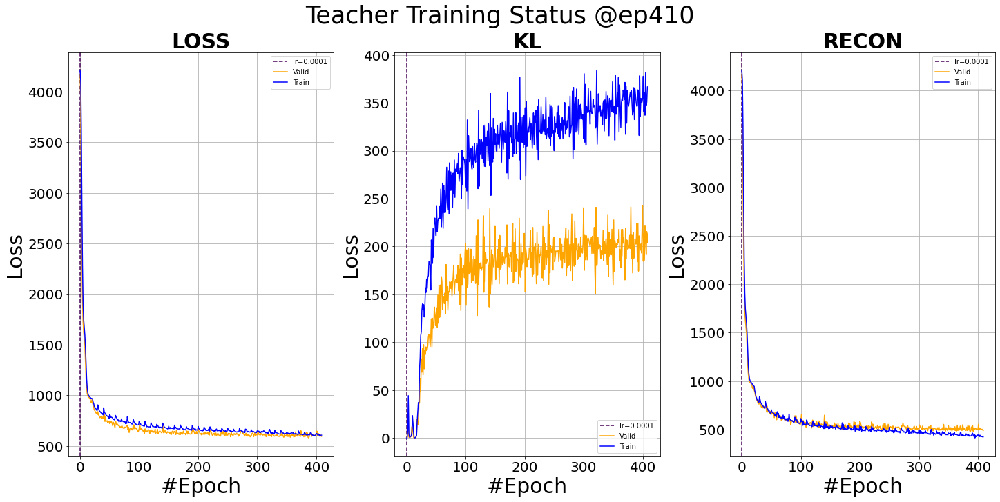

<Figure size 1440x720 with 0 Axes>

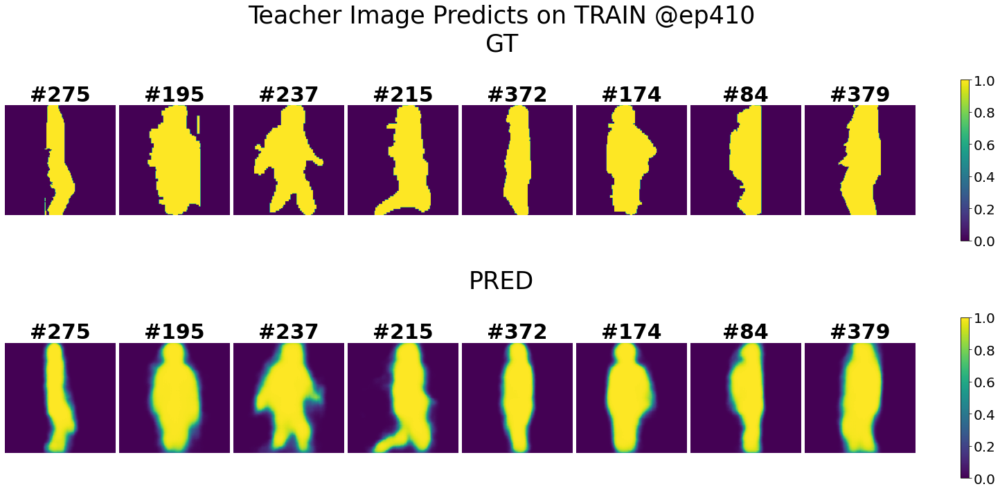

<Figure size 1440x720 with 0 Axes>

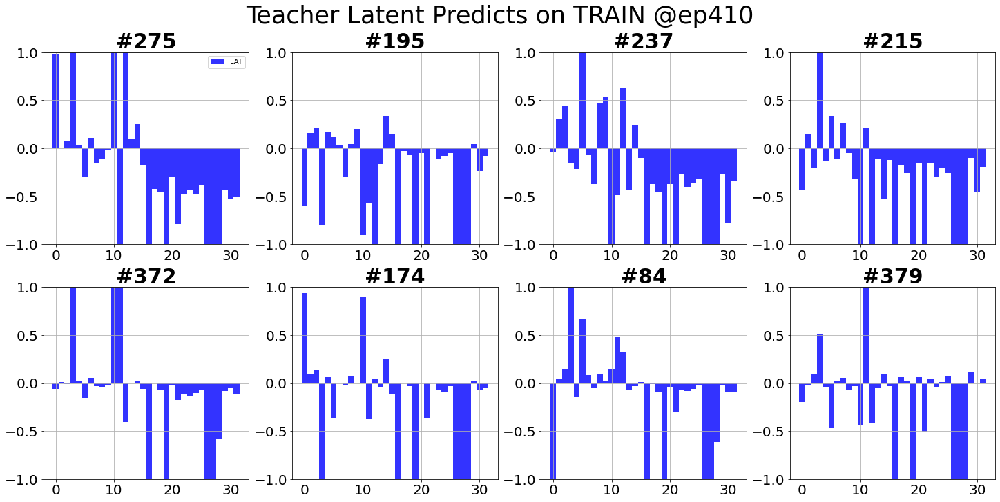

Teacher valid: epoch=9/10, batch=0/1, current best valid loss=579.7667        79.7667    
Total training time: 9.222096681594849 sec
Teacher test: sample=0/5, loss=342.7481    
Test finished. Average loss={'LOSS': 433.2040700145856, 'KL': 5.621905614325471, 'RECON': 430.3931174814893}

Total training time: 1.2507176399230957 sec


<Figure size 1440x720 with 0 Axes>

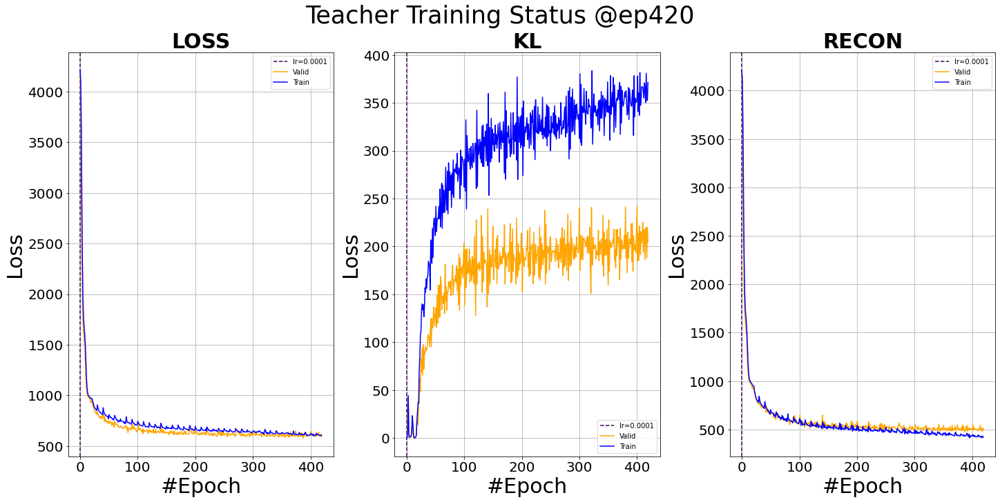

<Figure size 1440x720 with 0 Axes>

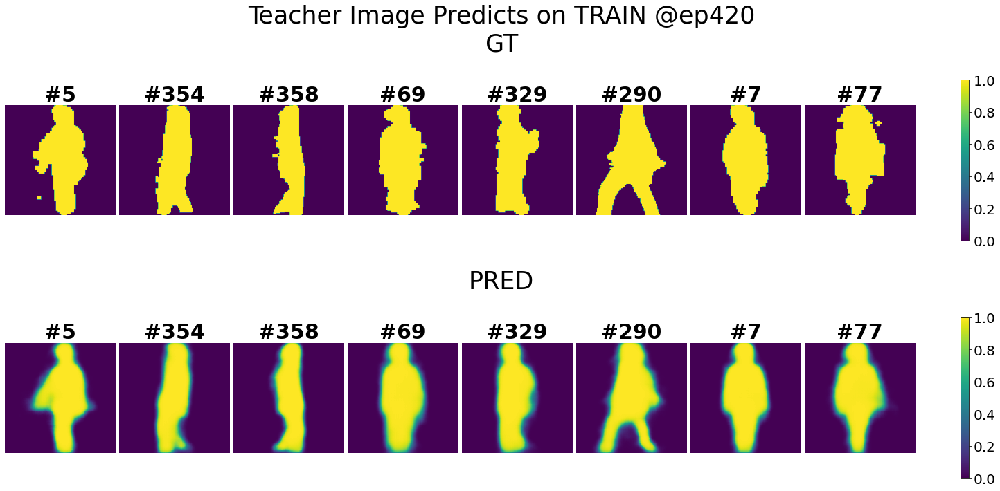

<Figure size 1440x720 with 0 Axes>

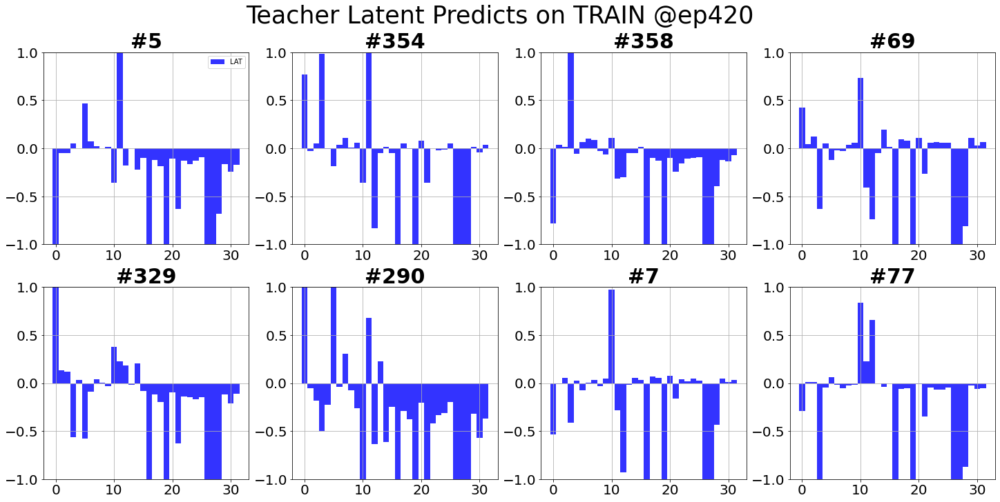

Teacher valid: epoch=9/10, batch=0/1, current best valid loss=579.7667        79.7667    
Total training time: 9.325599193572998 sec
Teacher test: sample=0/5, loss=496.7923    
Test finished. Average loss={'LOSS': 412.7571799226129, 'KL': 5.863203822224853, 'RECON': 409.82557658597204}

Total training time: 1.2709407806396484 sec


<Figure size 1440x720 with 0 Axes>

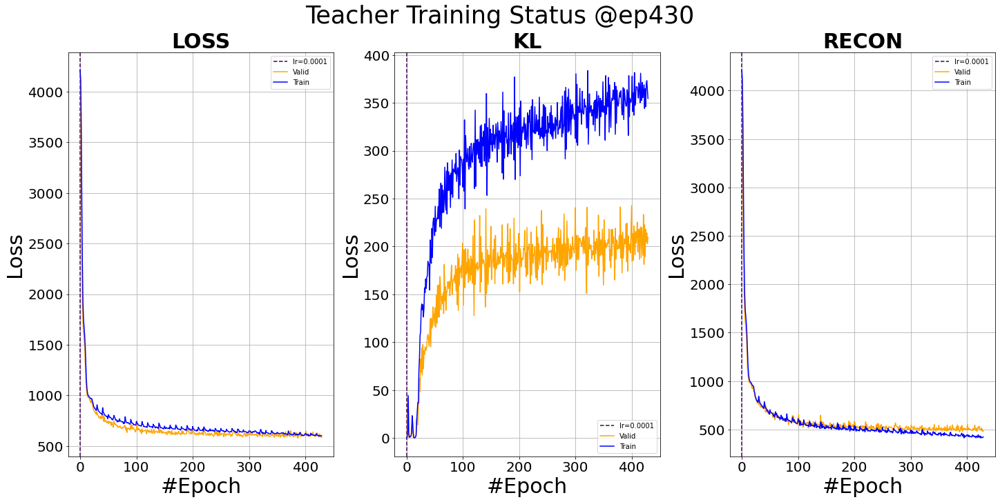

<Figure size 1440x720 with 0 Axes>

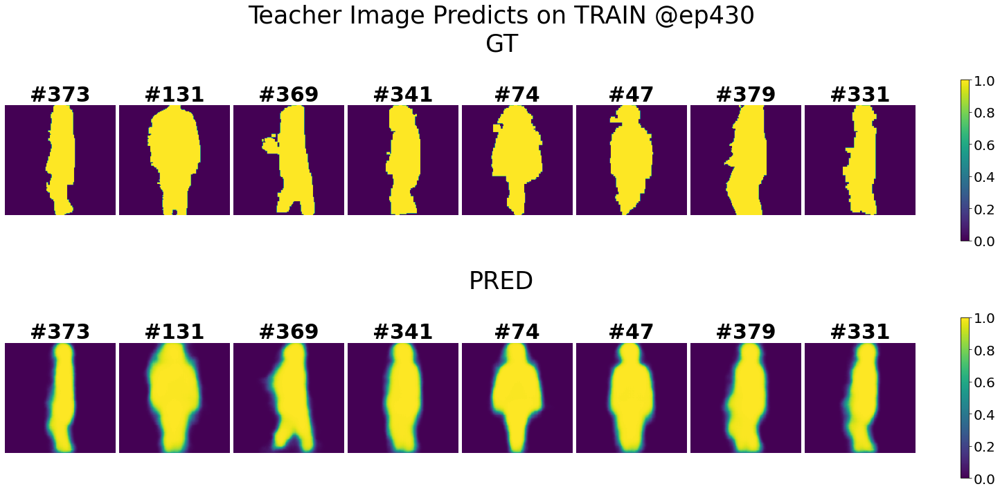

<Figure size 1440x720 with 0 Axes>

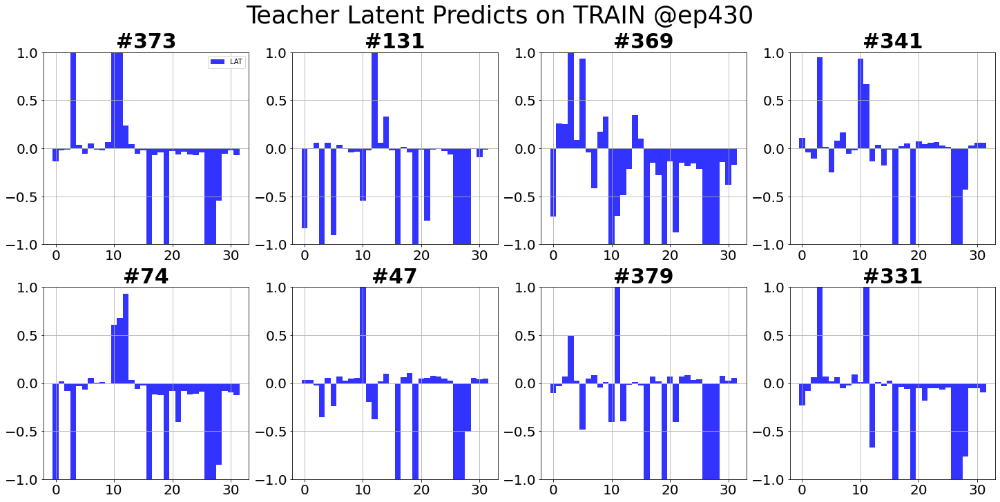

Teacher valid: epoch=9/10, batch=0/1, current best valid loss=579.7667        79.7667    
Total training time: 10.253276824951172 sec
Teacher test: sample=0/5, loss=485.0796    
Test finished. Average loss={'LOSS': 423.58328006658525, 'KL': 5.4616073419810105, 'RECON': 420.8524760647985}

Total training time: 1.2706515789031982 sec


<Figure size 1440x720 with 0 Axes>

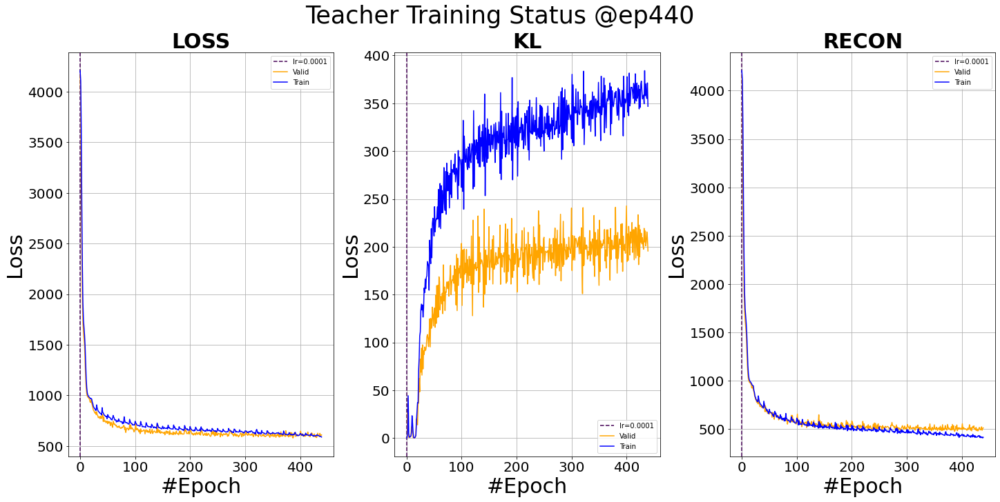

<Figure size 1440x720 with 0 Axes>

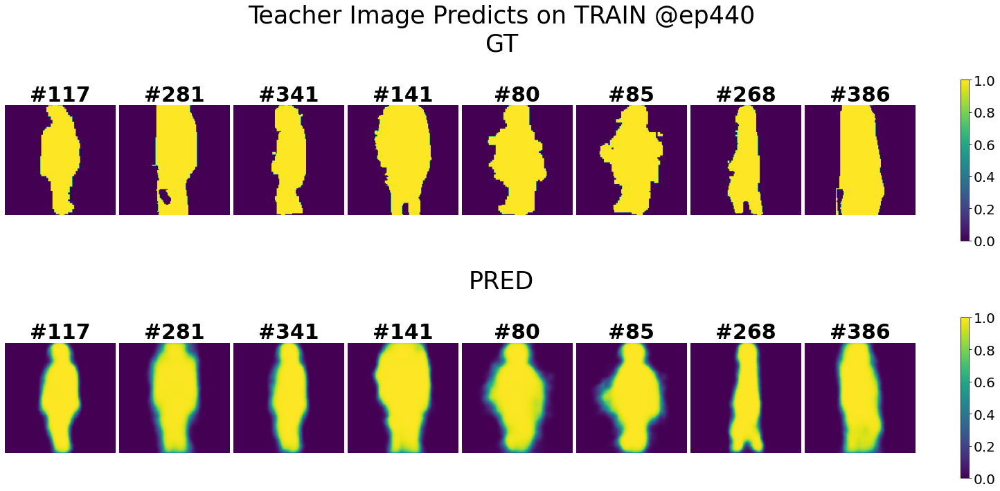

<Figure size 1440x720 with 0 Axes>

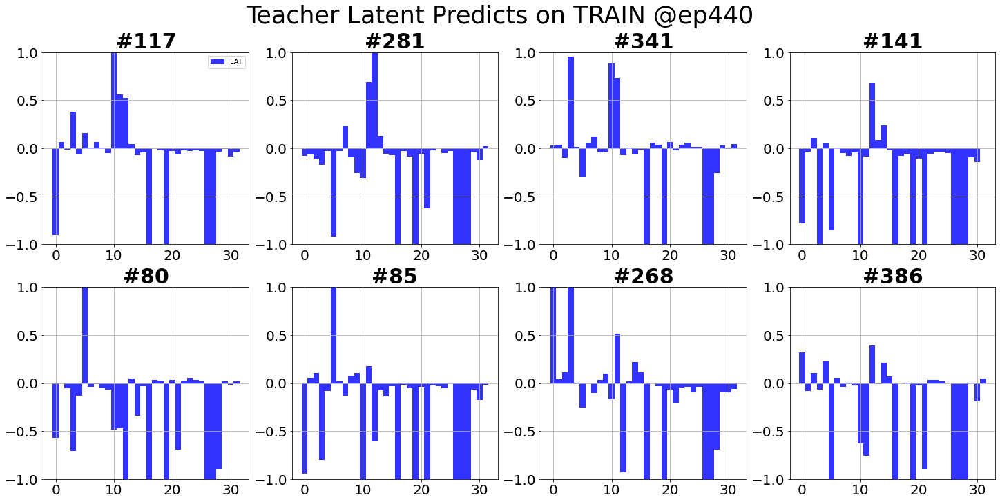

Teacher valid: epoch=9/10, batch=0/1, current best valid loss=579.7667        79.7667    
Total training time: 9.368222951889038 sec
Teacher test: sample=0/5, loss=454.3972    
Test finished. Average loss={'LOSS': 408.89817339047744, 'KL': 6.191771498830372, 'RECON': 405.8022865712451}

Total training time: 1.2713265419006348 sec


<Figure size 1440x720 with 0 Axes>

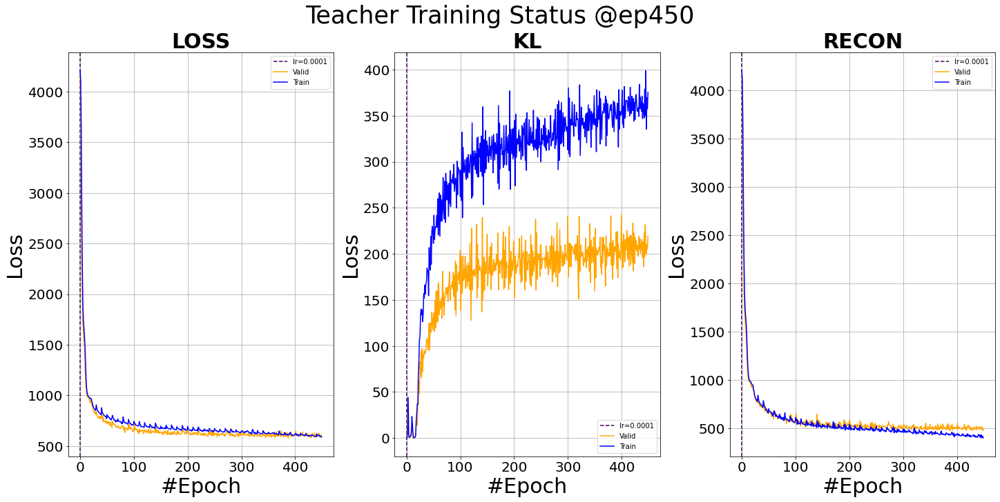

<Figure size 1440x720 with 0 Axes>

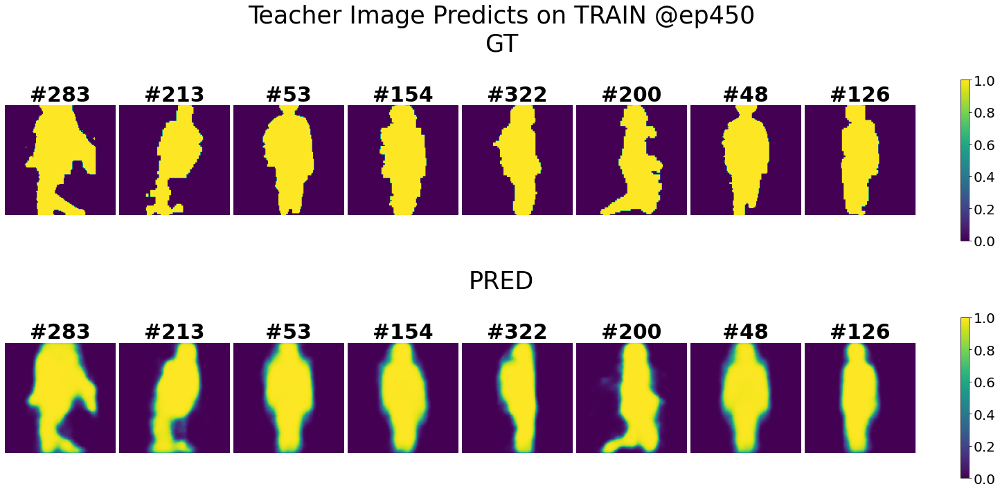

<Figure size 1440x720 with 0 Axes>

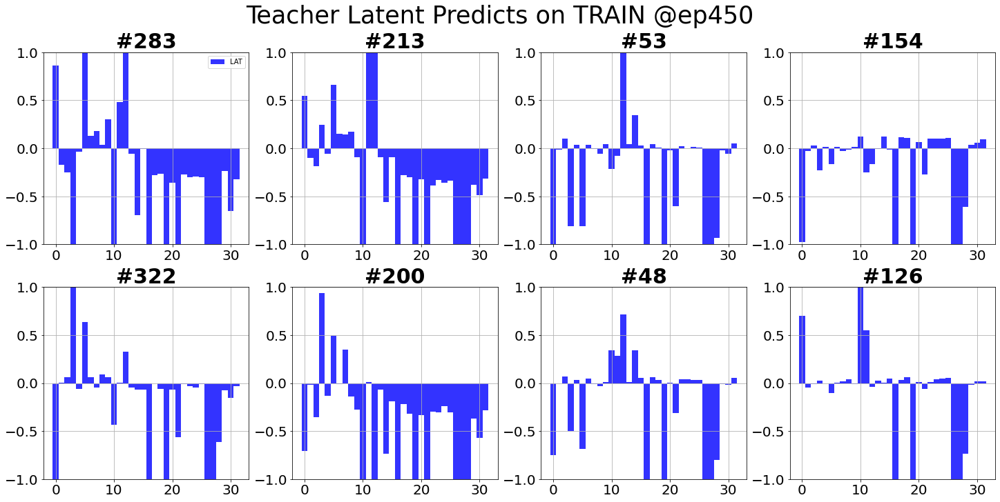

Teacher valid: epoch=9/10, batch=0/1, current best valid loss=579.7667        79.7667    
Total training time: 9.348966836929321 sec
Teacher test: sample=0/5, loss=420.0932    
Test finished. Average loss={'LOSS': 402.10725069199344, 'KL': 6.198234821055863, 'RECON': 399.0081327873794}

Total training time: 1.266638994216919 sec


<Figure size 1440x720 with 0 Axes>

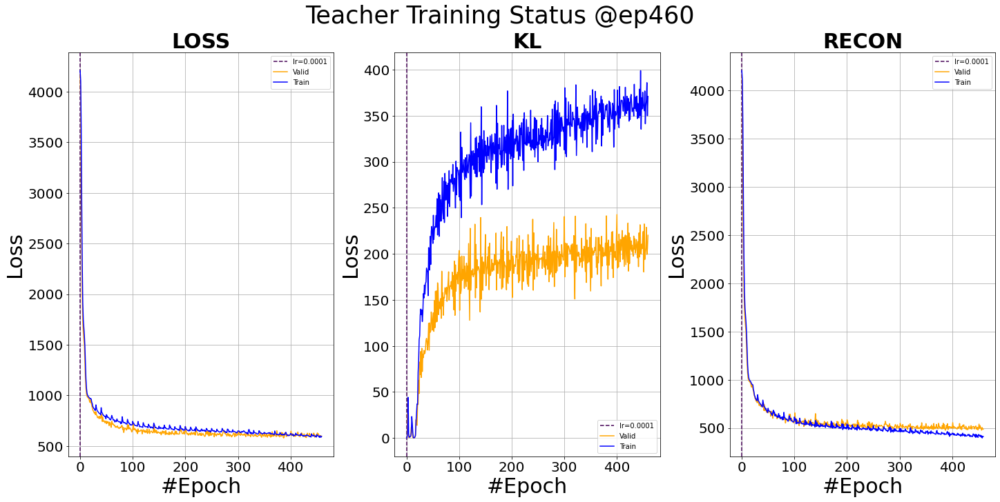

<Figure size 1440x720 with 0 Axes>

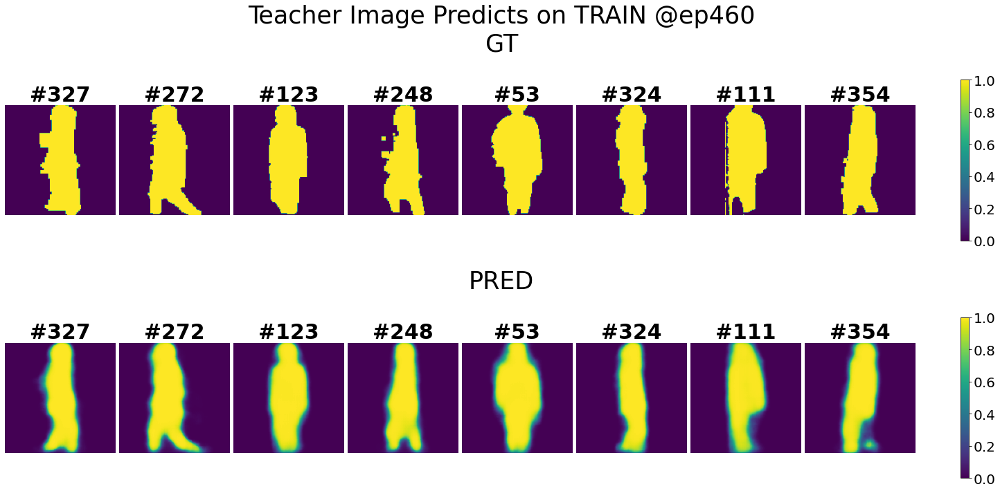

<Figure size 1440x720 with 0 Axes>

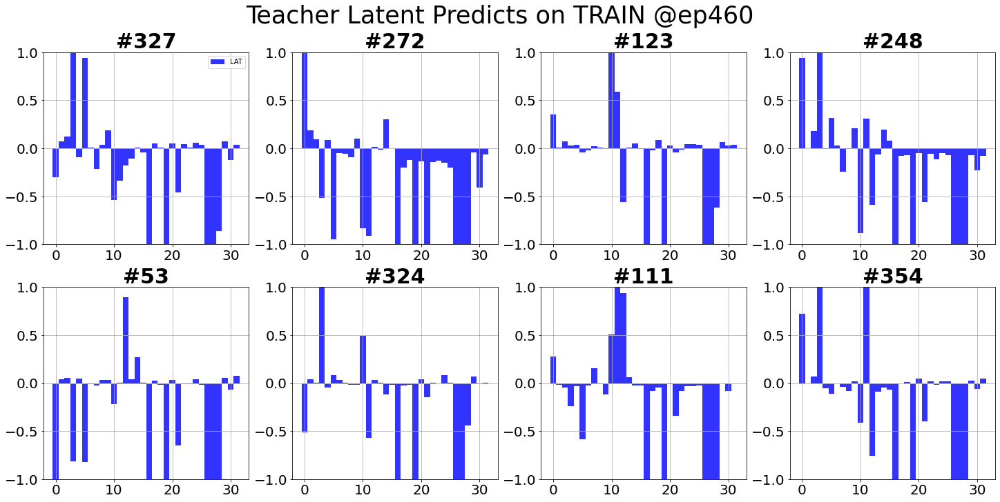

Teacher valid: epoch=9/10, batch=0/1, current best valid loss=579.7667        79.7667    
Total training time: 9.43544054031372 sec
Teacher test: sample=0/5, loss=662.8007    
Test finished. Average loss={'LOSS': 402.53123945131944, 'KL': 5.986726328491015, 'RECON': 399.5378767792435}

Total training time: 1.293360948562622 sec


<Figure size 1440x720 with 0 Axes>

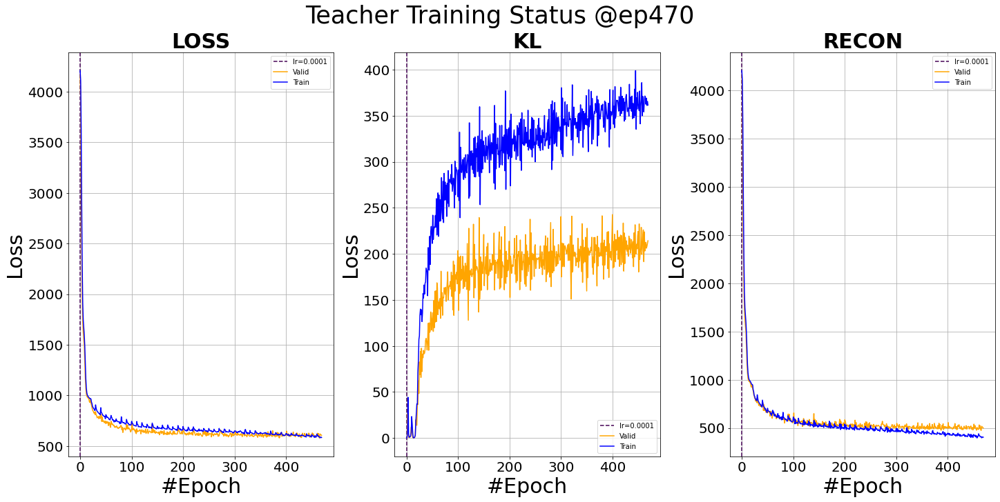

<Figure size 1440x720 with 0 Axes>

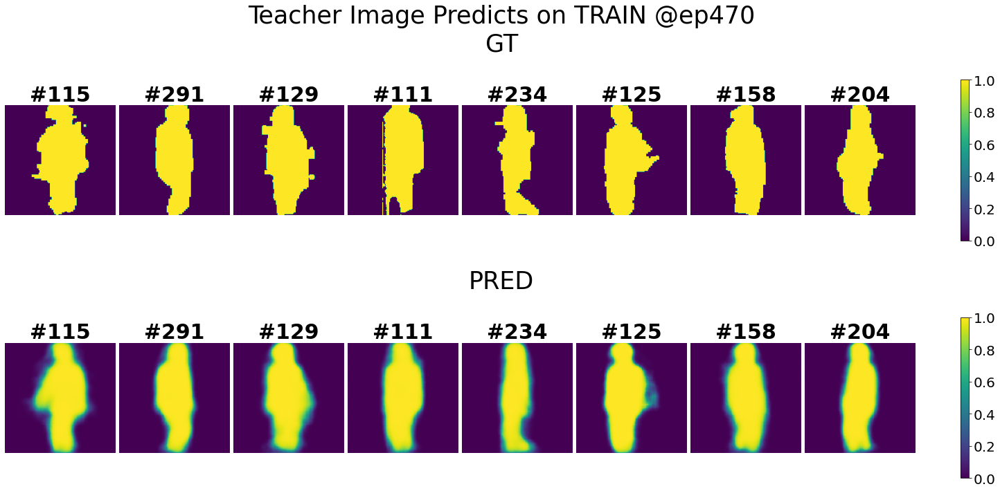

<Figure size 1440x720 with 0 Axes>

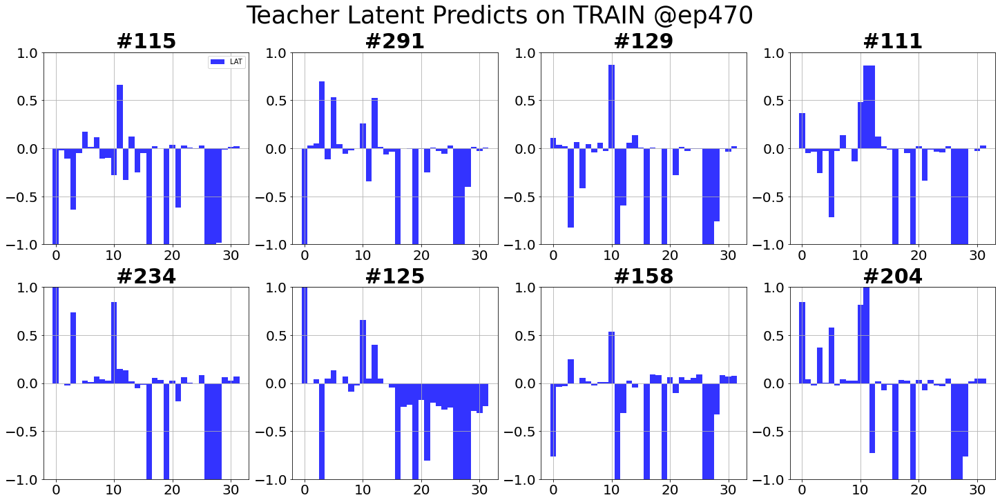

Teacher valid: epoch=9/10, batch=0/1, current best valid loss=579.7667        79.7667    
Total training time: 9.42009711265564 sec
Teacher test: sample=0/5, loss=274.5705    
Test finished. Average loss={'LOSS': 408.0187811161544, 'KL': 5.993458996248399, 'RECON': 405.0220506183587}

Total training time: 1.2737596035003662 sec


<Figure size 1440x720 with 0 Axes>

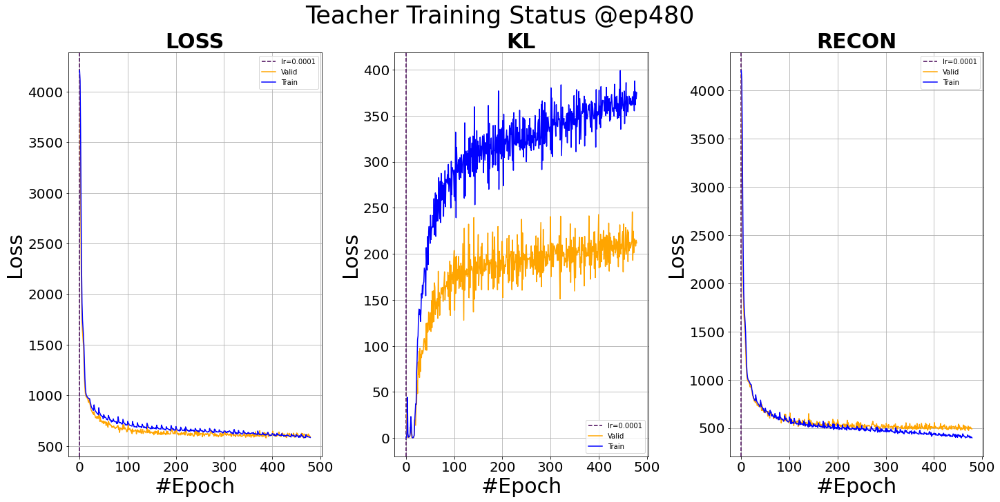

<Figure size 1440x720 with 0 Axes>

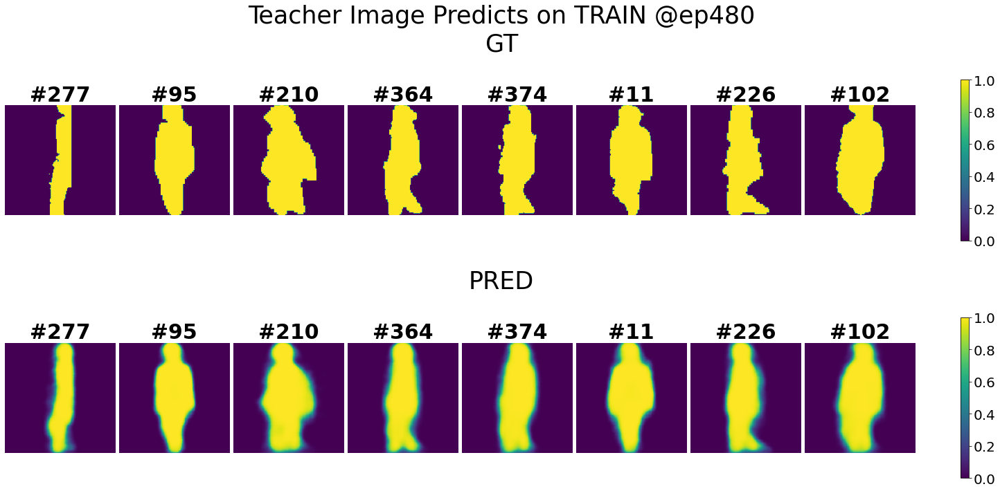

<Figure size 1440x720 with 0 Axes>

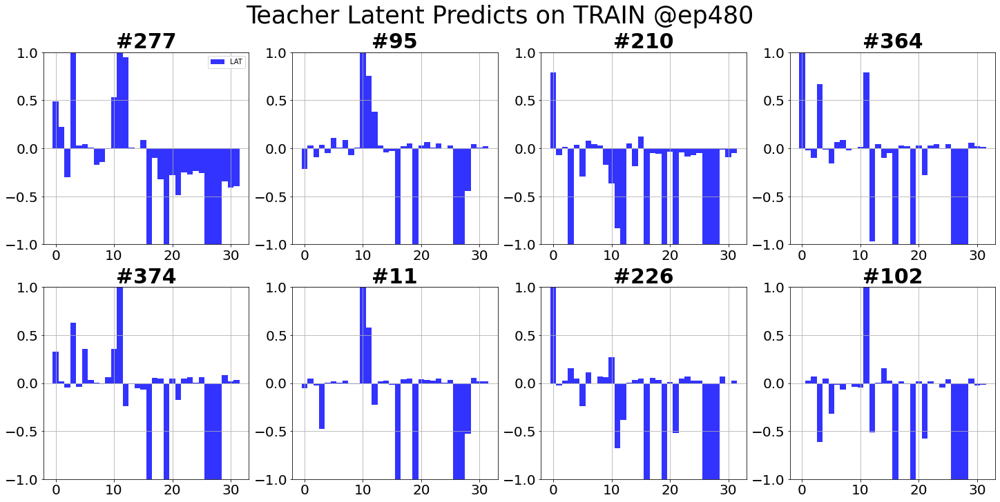

Teacher valid: epoch=9/10, batch=0/1, current best valid loss=579.7667        79.7667    
Total training time: 9.402283906936646 sec
Teacher test: sample=0/5, loss=282.6928    
Test finished. Average loss={'LOSS': 412.8272187211506, 'KL': 5.644017500126093, 'RECON': 410.00521041036035}

Total training time: 1.2701456546783447 sec


<Figure size 1440x720 with 0 Axes>

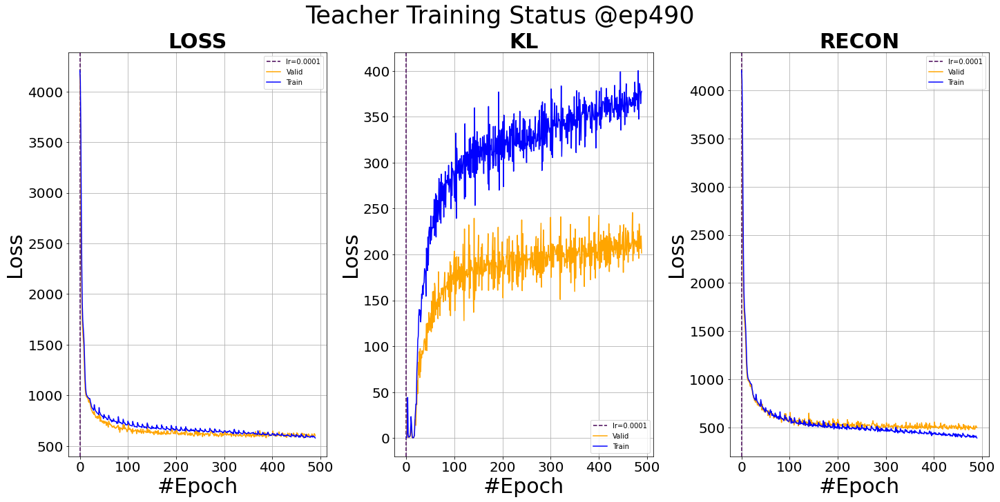

<Figure size 1440x720 with 0 Axes>

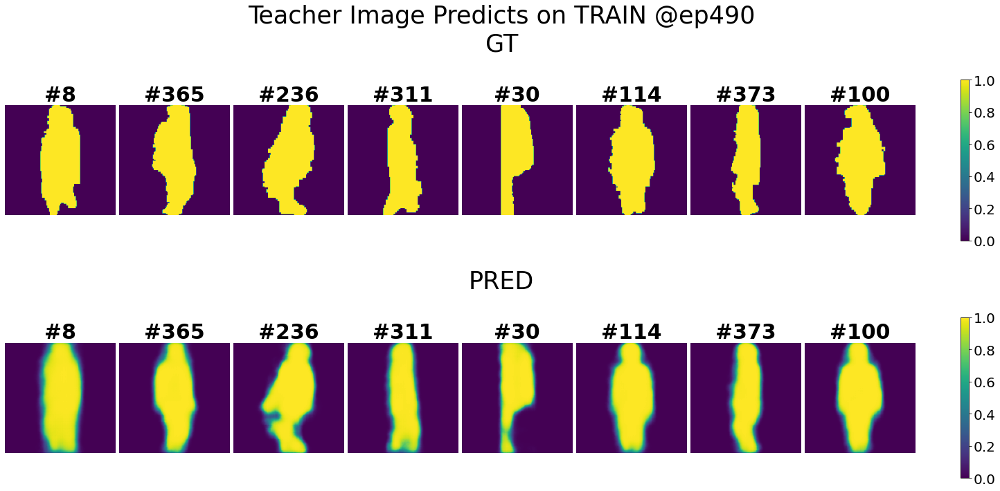

<Figure size 1440x720 with 0 Axes>

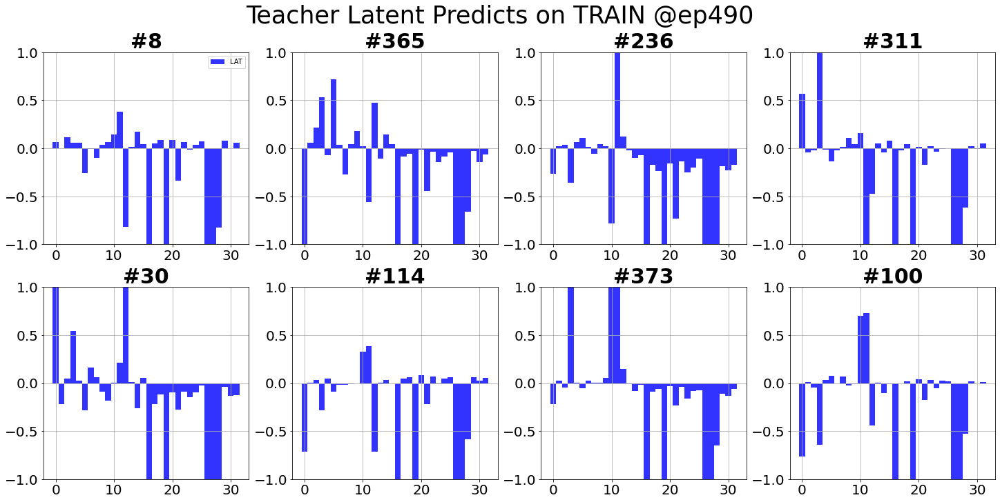

Teacher valid: epoch=9/10, batch=0/1, current best valid loss=579.7667        79.7667    
Total training time: 9.403241634368896 sec
Teacher test: sample=0/5, loss=481.6174    
Test finished. Average loss={'LOSS': 409.00752881408886, 'KL': 5.79157420446635, 'RECON': 406.11174276174074}

Total training time: 1.2840557098388672 sec


<Figure size 1440x720 with 0 Axes>

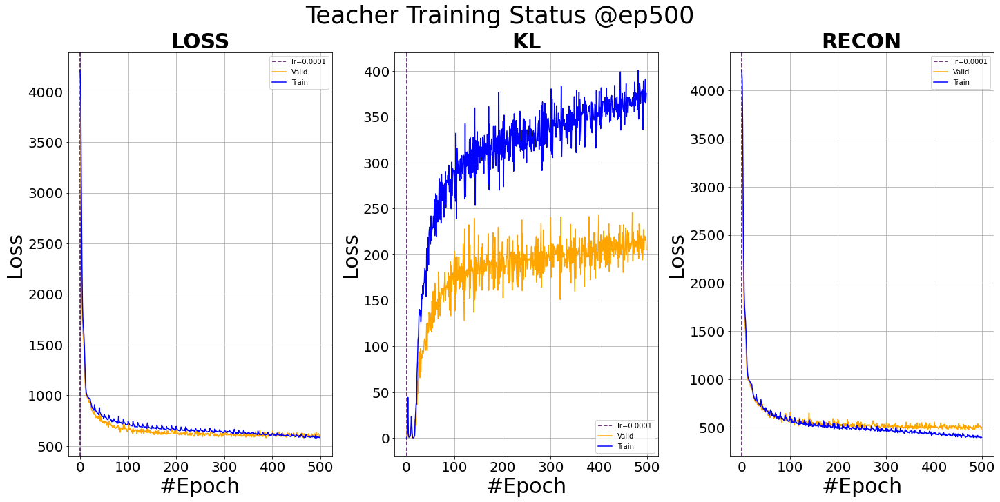

<Figure size 1440x720 with 0 Axes>

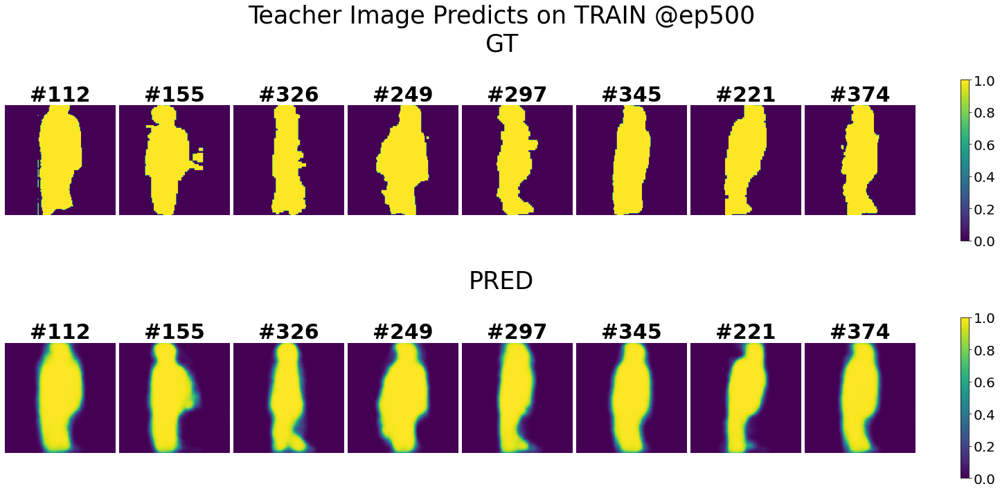

<Figure size 1440x720 with 0 Axes>

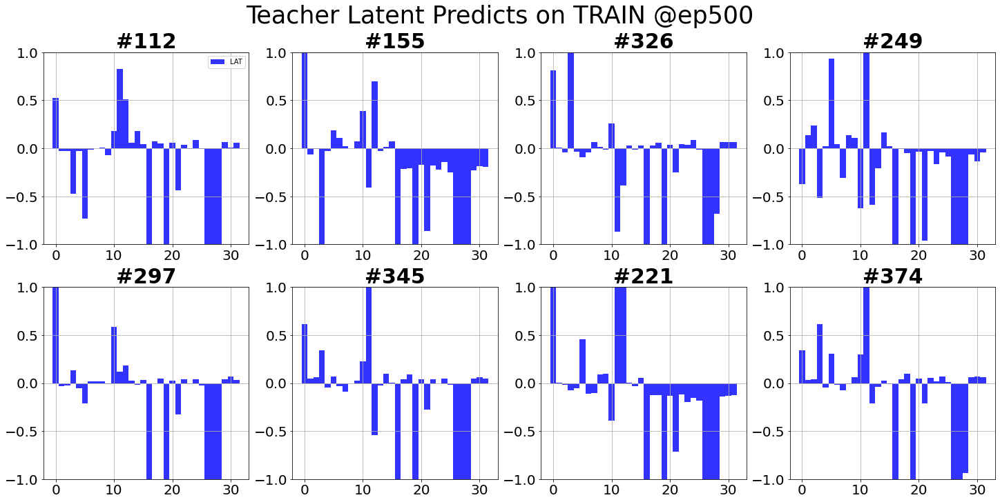


Schedule Completed!


In [36]:
### Scheduler
%matplotlib inline
#trainer1.lr=1e-5
T_trainer.scheduler(turns=10,
                  test_loader='train', select_num=8,
                  autosave=True, notion=f"{date_run}", save_model=False)

Teacher test: sample=35/40, loss=236.8544     
Test finished. Average loss={'LOSS': 596.135966873169, 'KL': 5.3429873287677765, 'RECON': 593.4644691467286}

Total training time: 0.20402026176452637 sec


<Figure size 1440x720 with 0 Axes>

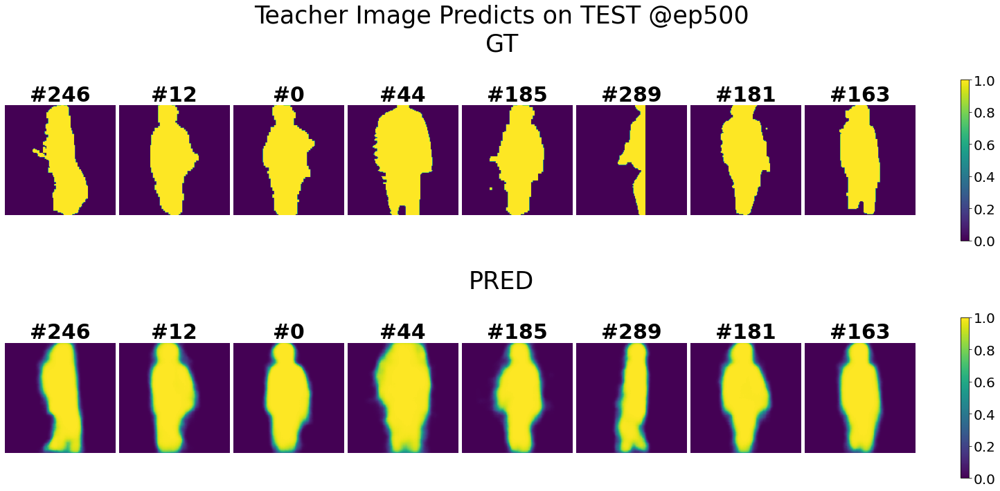

<Figure size 1440x720 with 0 Axes>

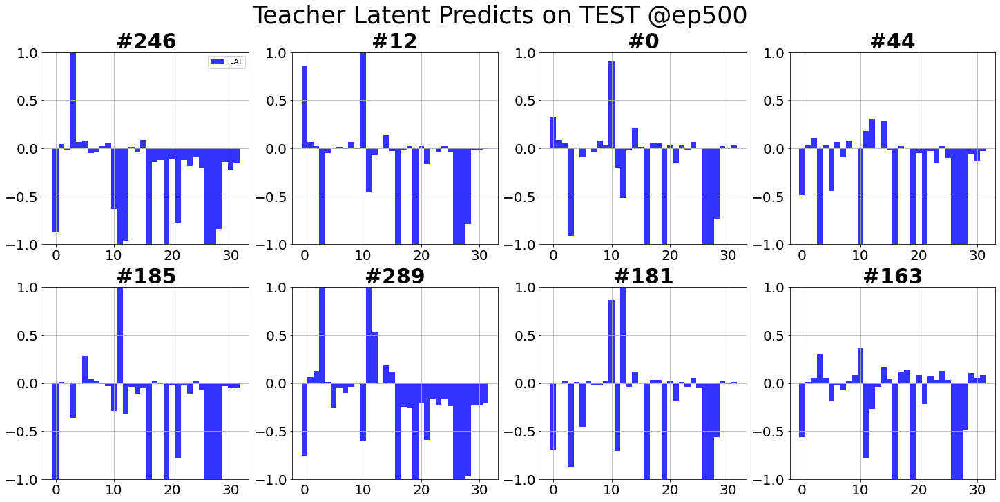

In [37]:
T_trainer.test(loader='test')
T_trainer.plot_test(select_num=8, autosave=True, notion=f"{date_run}")

In [38]:
T_trainer.save(f"{date_run}")

Saving models...
Saving imgen...
Saving imgde...
All saved!


### Student

#### Train

In [5]:
torch.cuda.set_device(gpu)
csiencoder = TP.CSIEncoder(lstm_steps=225)
bbxdecoder = TP.BBXDecoder()
imgencoder = TP.ImageEncoder(latent_dim=16)
imgdecoder = TP.ImageDecoder(latent_dim=16)
imgencoder.load_state_dict(torch.load(f"../saved/240415_900N/240415_900N_Teacher_IMGENV07C0@ep500.pth"))
imgdecoder.load_state_dict(torch.load(f"../saved/240415_900N/240415_900N_Teacher_IMGDEV07C0@ep500.pth"))

S_trainer = TP.StudentTrainer(
                              name='Student', mask=True,
    networks=[csiencoder, bbxdecoder, imgencoder, imgdecoder],
#    networks=[csiencoder, bbxdecoder, T_trainer.models['imgen'], T_trainer.models['imgde']],
                 lr=1e-4, epochs=10, cuda=gpu,
                 train_loader=train_loader, valid_loader=valid_loader, test_loader=test_loader)

Student valid: epoch=9/10, batch=0/1, current best valid loss=1.0450        .0450    
Total training time: 40.670737743377686 sec


/home/bob/.local/lib/python3.7/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([])) that is different to the input size (torch.Size([1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Student test: sample=0/5, loss=0.0419    
Test finished. Average loss={'LOSS': 0.04163564648778684, 'MU': 0.26795811268989106, 'LOGVAR': 0.09399406744580464, 'BBX': 1.0019434586981868, 'DPT': 0.004165840569008389, 'IMG': 0.0662287382702448}

Total training time: 4.984713792800903 sec


<Figure size 432x288 with 0 Axes>

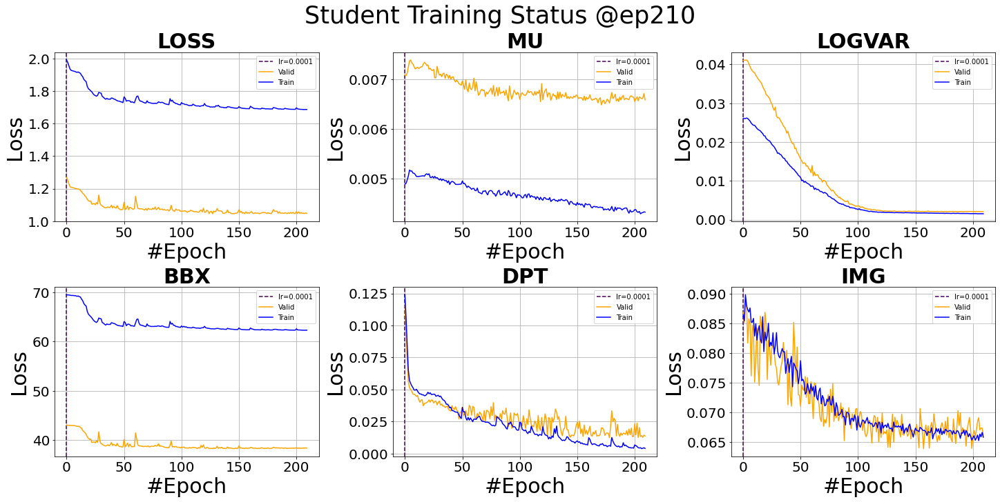

<Figure size 1440x720 with 0 Axes>

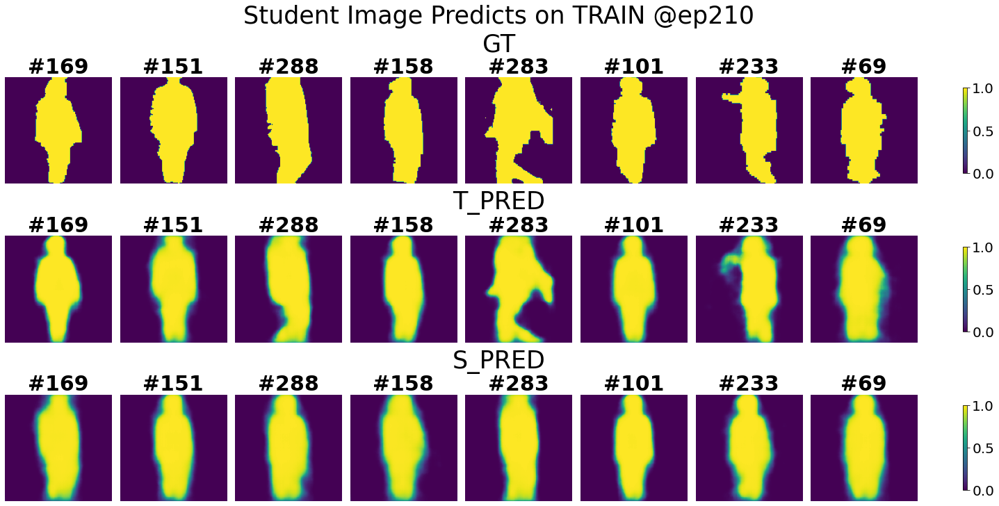

<Figure size 1440x720 with 0 Axes>

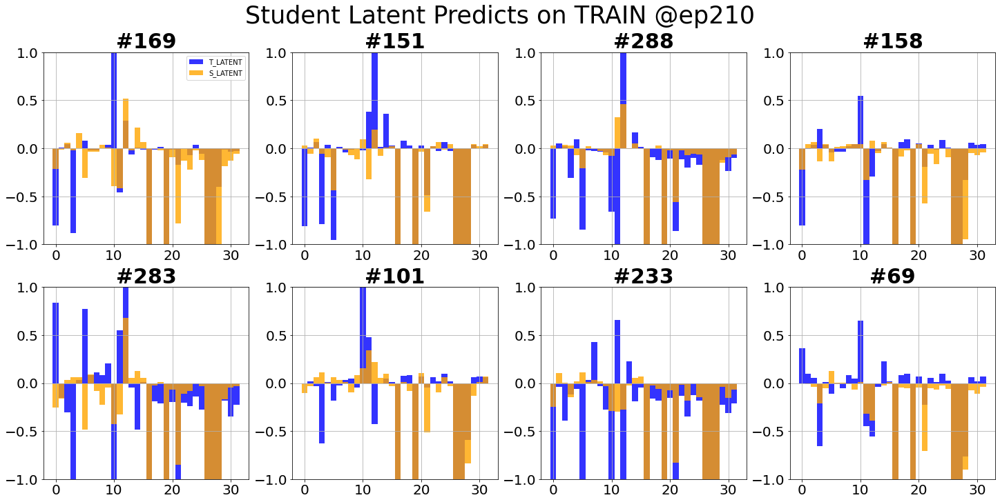

<Figure size 1440x720 with 0 Axes>

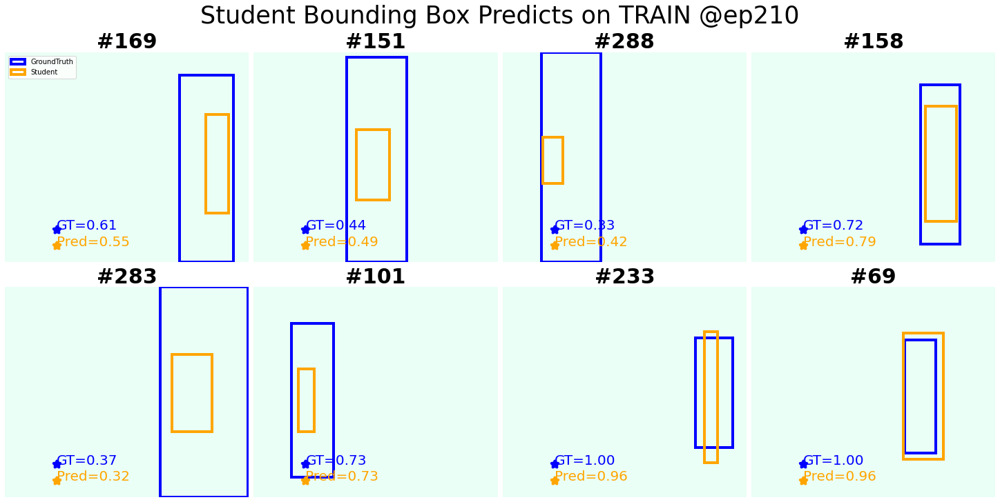

<Figure size 1440x720 with 0 Axes>

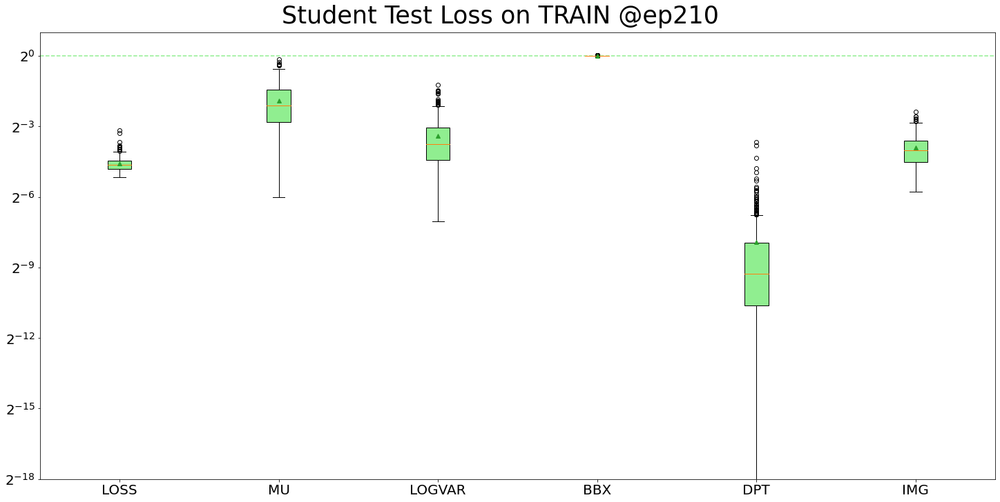

<Figure size 1440x720 with 0 Axes>

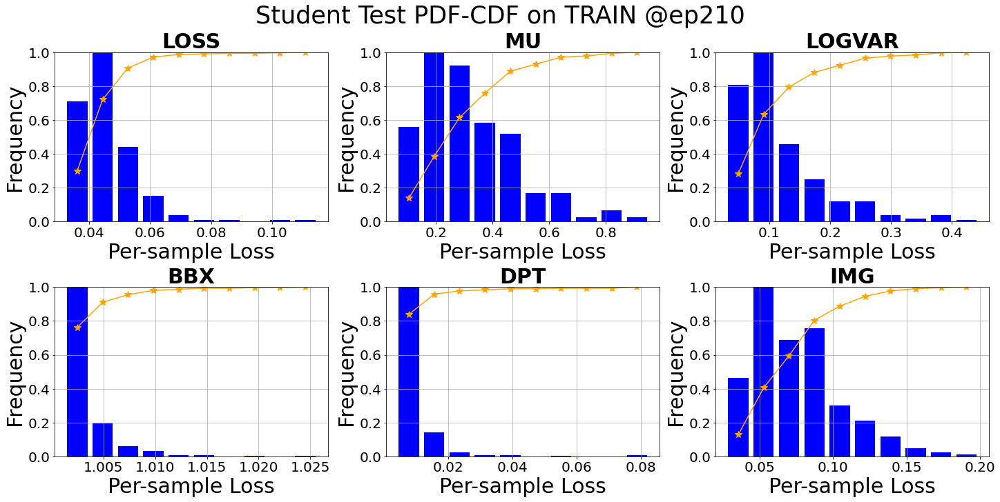

Student valid: epoch=9/10, batch=0/1, current best valid loss=1.0450        .0450    
Total training time: 41.14309573173523 sec


/home/bob/.local/lib/python3.7/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([])) that is different to the input size (torch.Size([1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Student test: sample=0/5, loss=0.0420    
Test finished. Average loss={'LOSS': 0.04037708355491185, 'MU': 0.26532750094004, 'LOGVAR': 0.09238653395390826, 'BBX': 1.0015187723460304, 'DPT': 0.002939597795460256, 'IMG': 0.06628634727341377}

Total training time: 5.044354200363159 sec


<Figure size 1440x720 with 0 Axes>

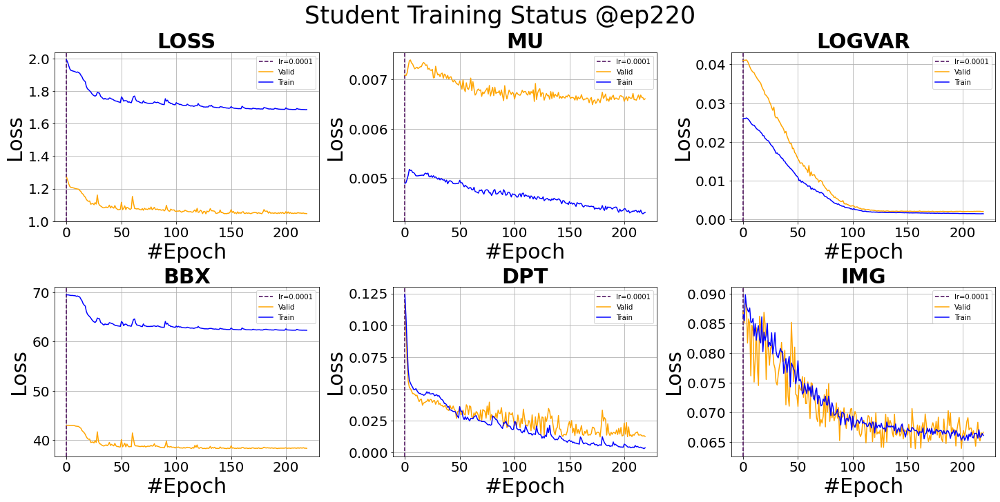

<Figure size 1440x720 with 0 Axes>

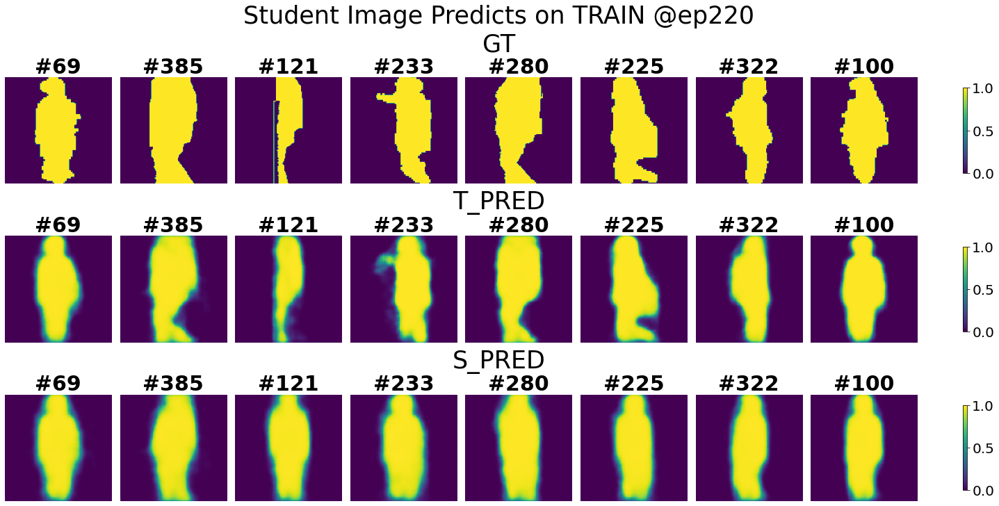

<Figure size 1440x720 with 0 Axes>

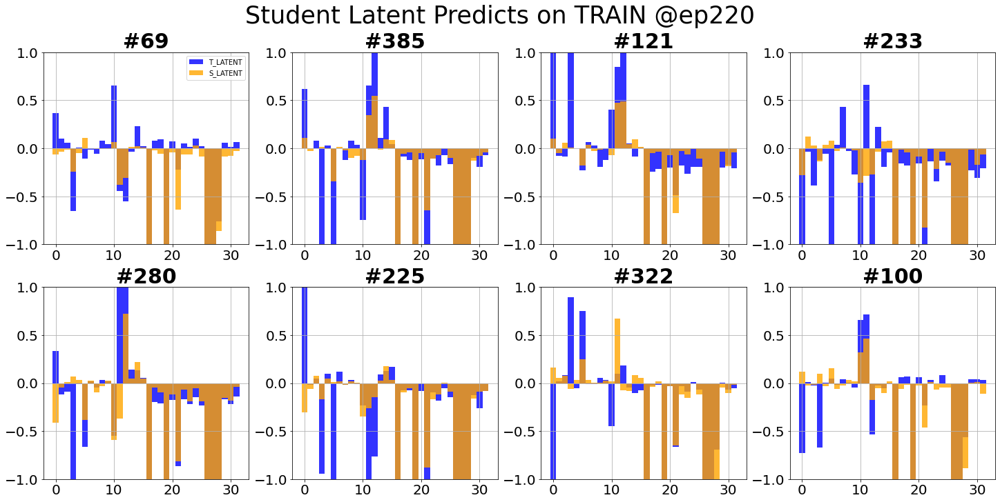

<Figure size 1440x720 with 0 Axes>

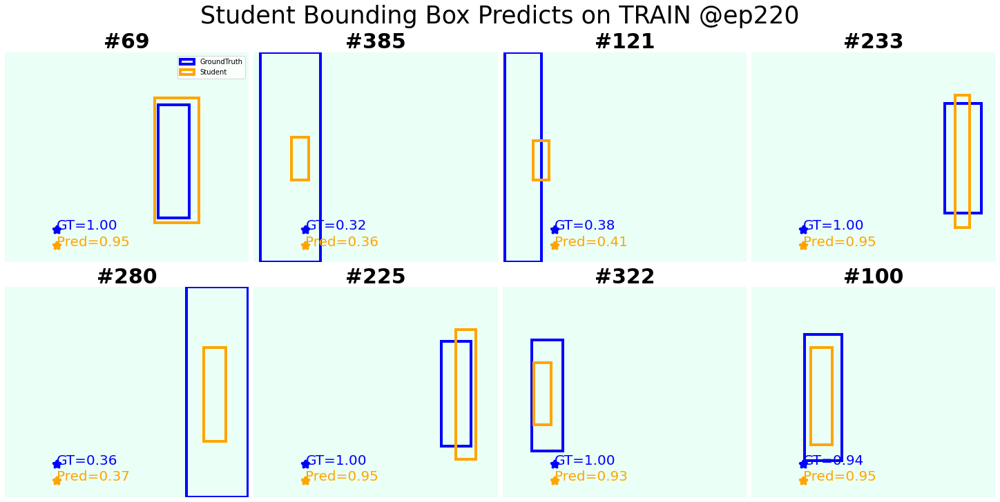

<Figure size 1440x720 with 0 Axes>

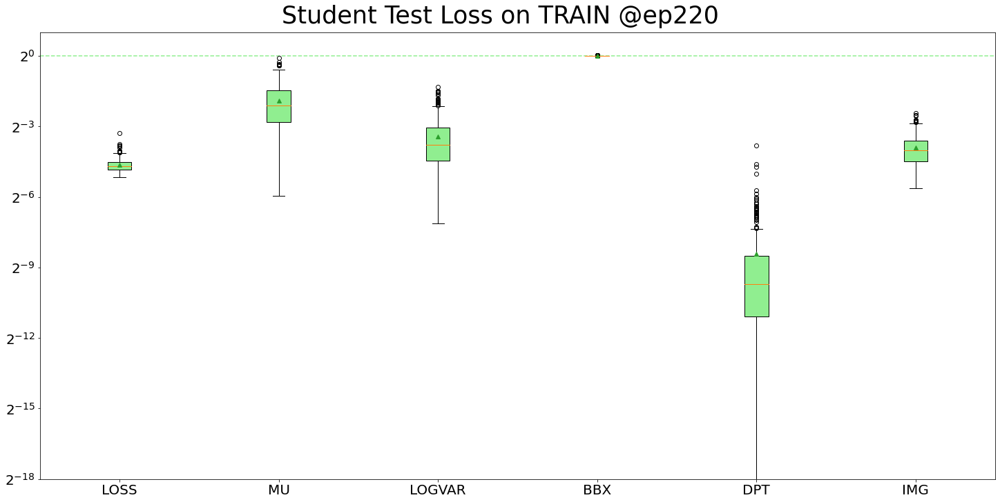

<Figure size 1440x720 with 0 Axes>

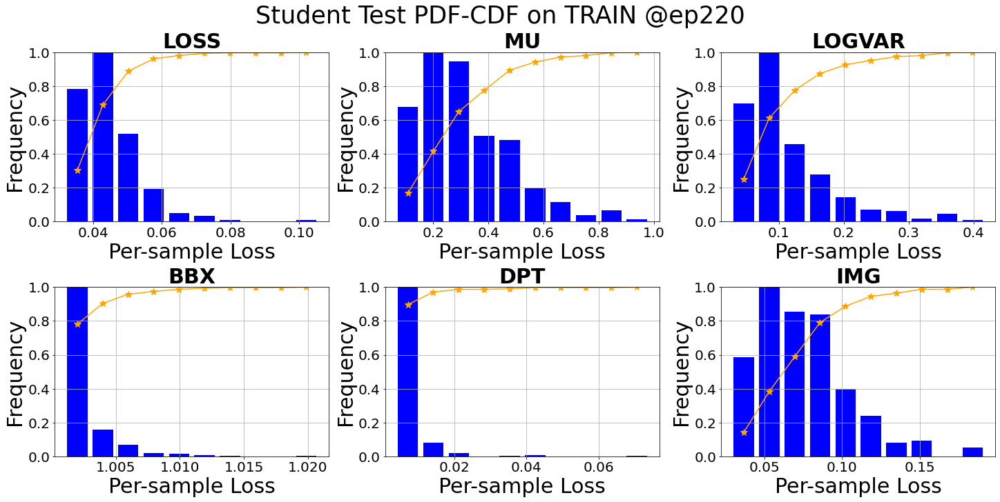

Student valid: epoch=9/10, batch=0/1, current best valid loss=1.0450        .0450    
Total training time: 41.795660734176636 sec


/home/bob/.local/lib/python3.7/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([])) that is different to the input size (torch.Size([1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Student test: sample=0/5, loss=0.0311    
Test finished. Average loss={'LOSS': 0.03961977968741077, 'MU': 0.26354000429919294, 'LOGVAR': 0.09056006514518207, 'BBX': 1.0011846547724732, 'DPT': 0.0022206999779915237, 'IMG': 0.06584568657100776}

Total training time: 5.06662654876709 sec


<Figure size 1440x720 with 0 Axes>

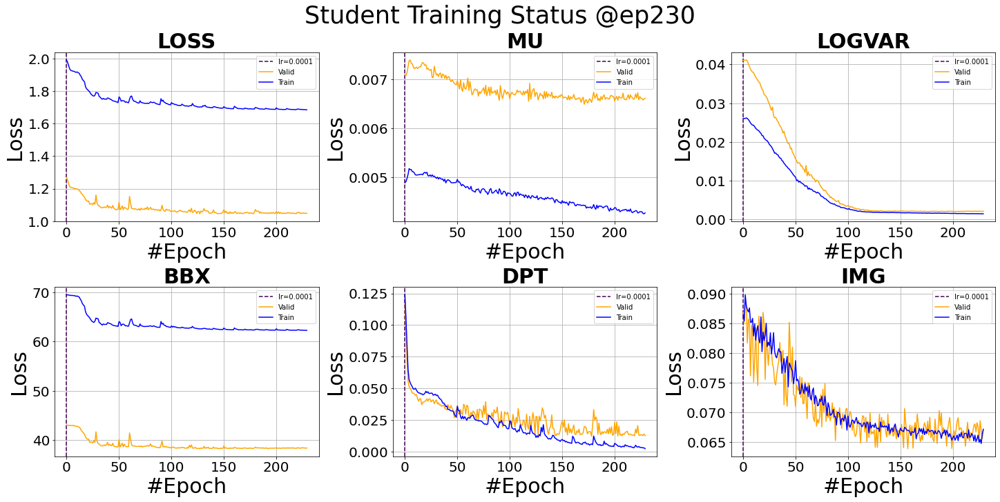

<Figure size 1440x720 with 0 Axes>

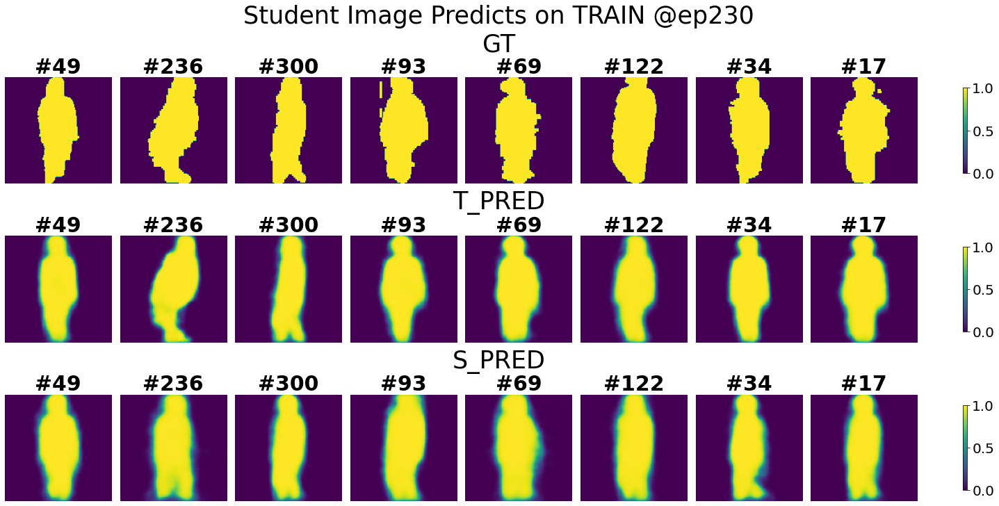

<Figure size 1440x720 with 0 Axes>

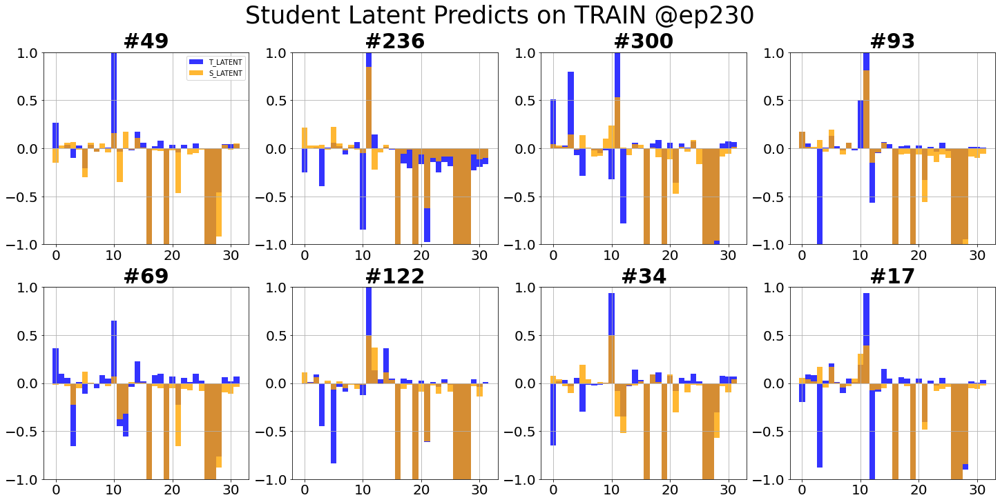

<Figure size 1440x720 with 0 Axes>

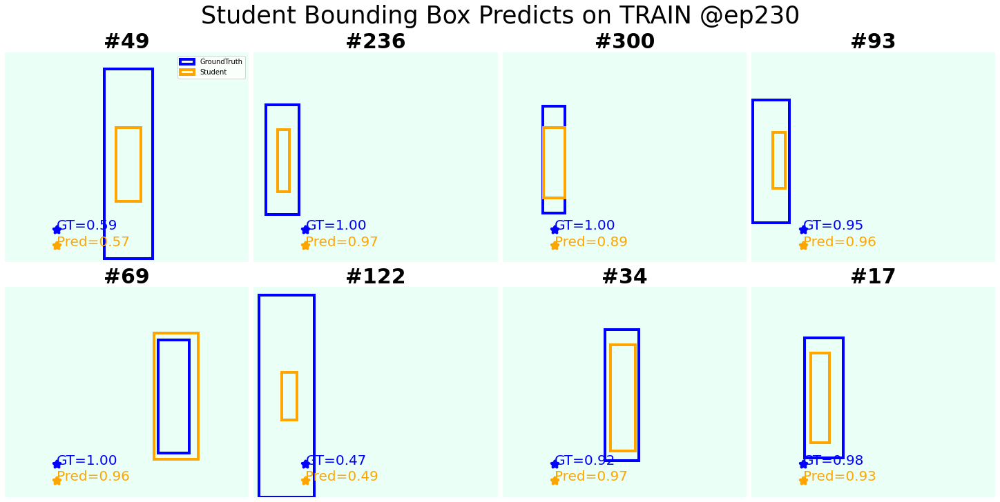

<Figure size 1440x720 with 0 Axes>

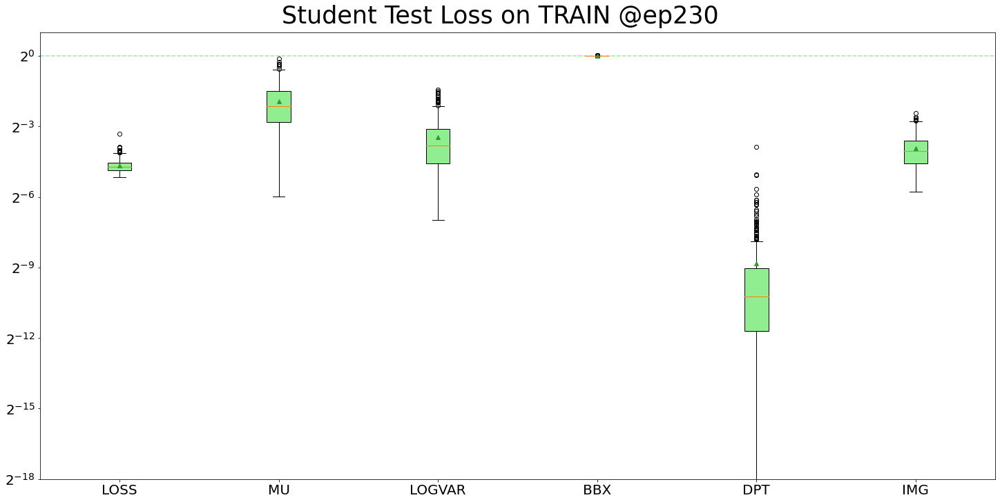

<Figure size 1440x720 with 0 Axes>

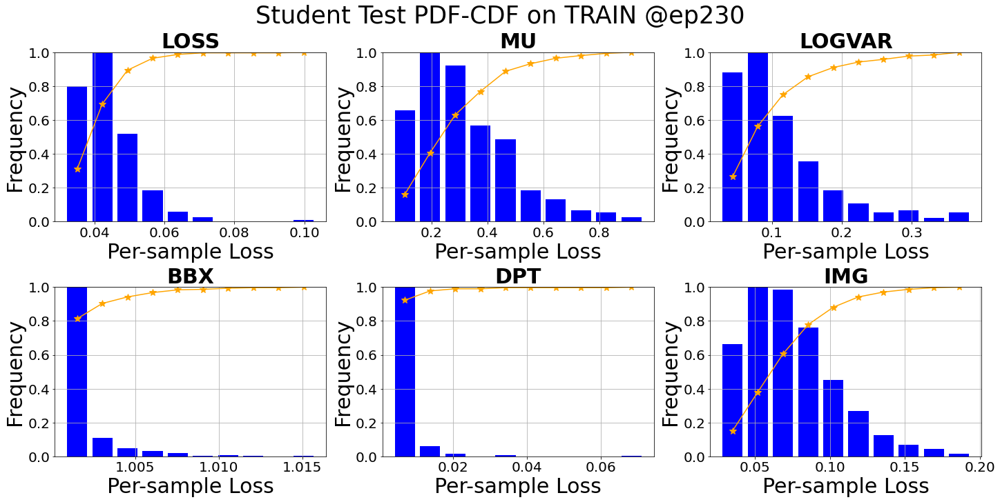

Student valid: epoch=9/10, batch=0/1, current best valid loss=1.0450        .0450    
Total training time: 41.70828080177307 sec


/home/bob/.local/lib/python3.7/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([])) that is different to the input size (torch.Size([1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Student test: sample=0/5, loss=0.0343    
Test finished. Average loss={'LOSS': 0.039551077710039365, 'MU': 0.2628359445984628, 'LOGVAR': 0.08936285465308899, 'BBX': 1.0012099995873749, 'DPT': 0.0021856433958530293, 'IMG': 0.0661735927620214}

Total training time: 5.068564176559448 sec


<Figure size 1440x720 with 0 Axes>

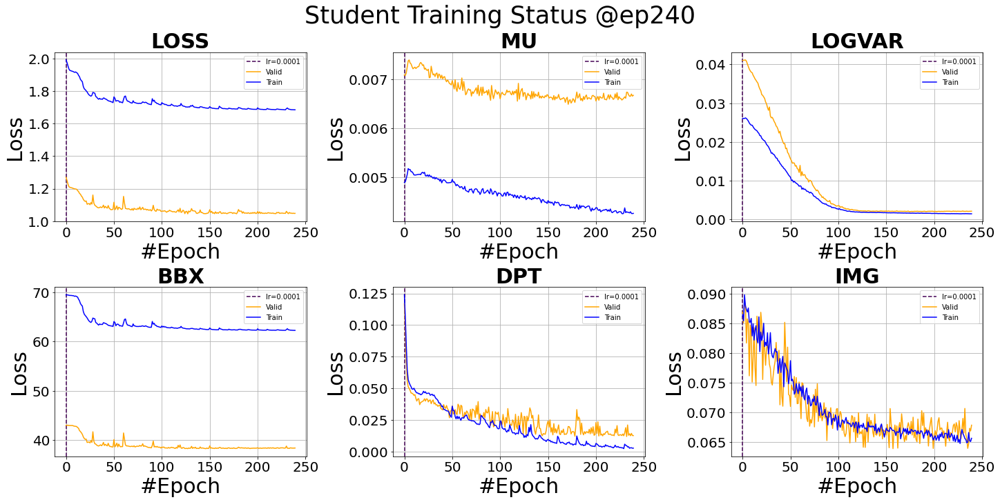

<Figure size 1440x720 with 0 Axes>

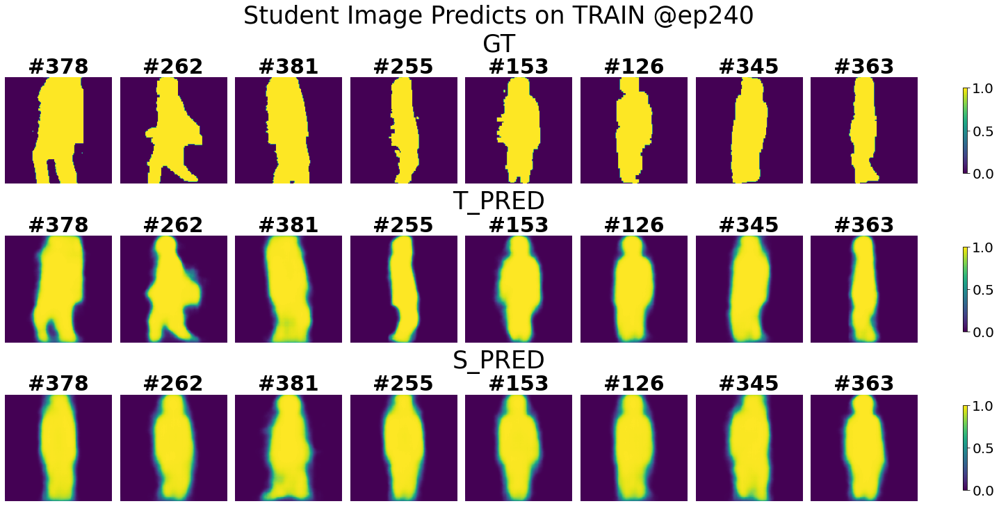

<Figure size 1440x720 with 0 Axes>

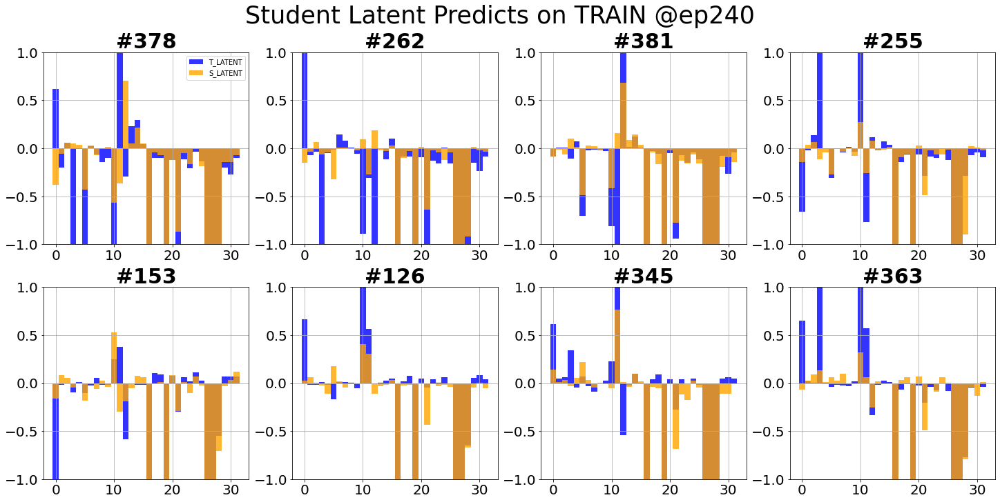

<Figure size 1440x720 with 0 Axes>

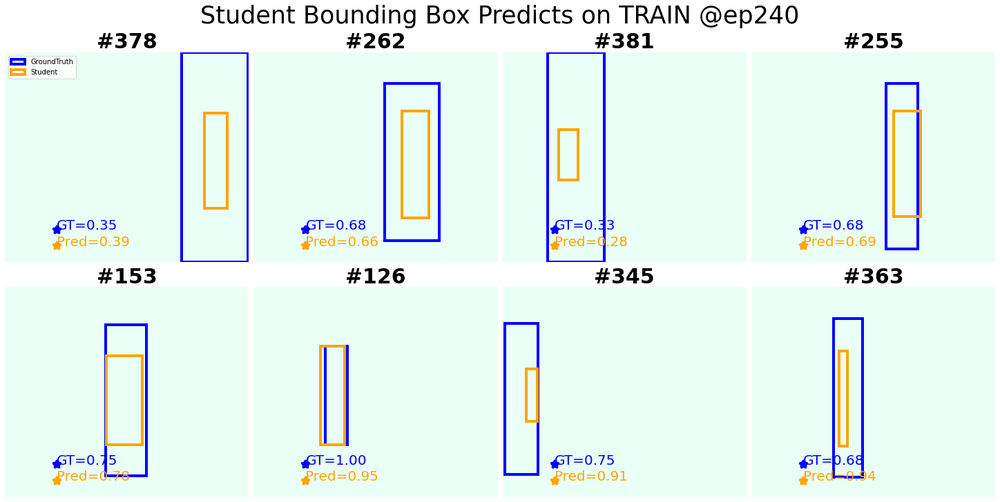

<Figure size 1440x720 with 0 Axes>

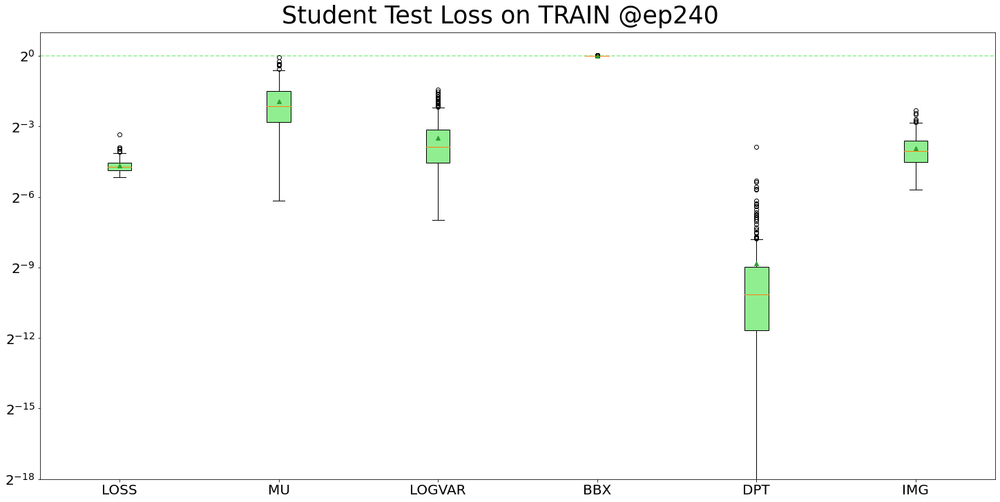

<Figure size 1440x720 with 0 Axes>

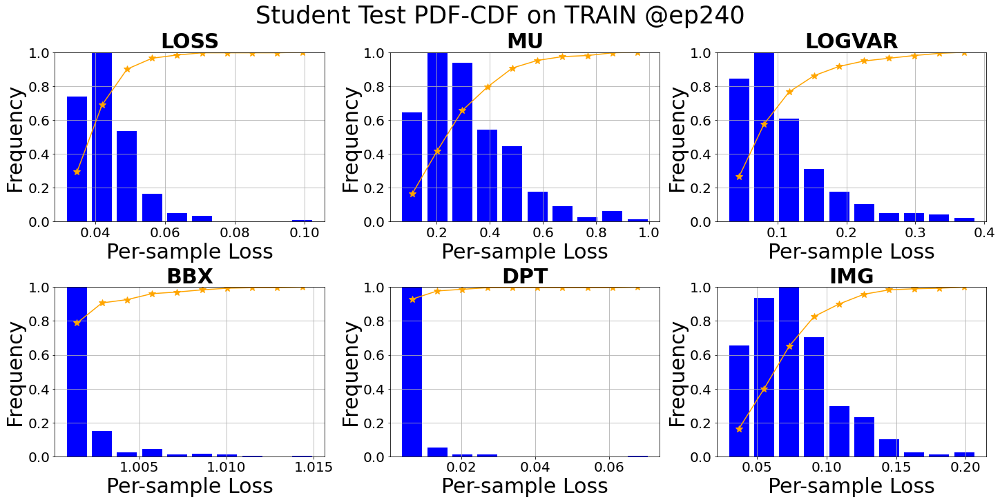

Student valid: epoch=9/10, batch=0/1, current best valid loss=1.0450        .0450    
Total training time: 41.90391254425049 sec


/home/bob/.local/lib/python3.7/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([])) that is different to the input size (torch.Size([1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Student test: sample=0/5, loss=0.0424    
Test finished. Average loss={'LOSS': 0.039372785663729315, 'MU': 0.2618948726636325, 'LOGVAR': 0.08844744090374164, 'BBX': 1.0011695010102446, 'DPT': 0.00204077810903465, 'IMG': 0.06525318735425878}

Total training time: 5.072216749191284 sec


<Figure size 1440x720 with 0 Axes>

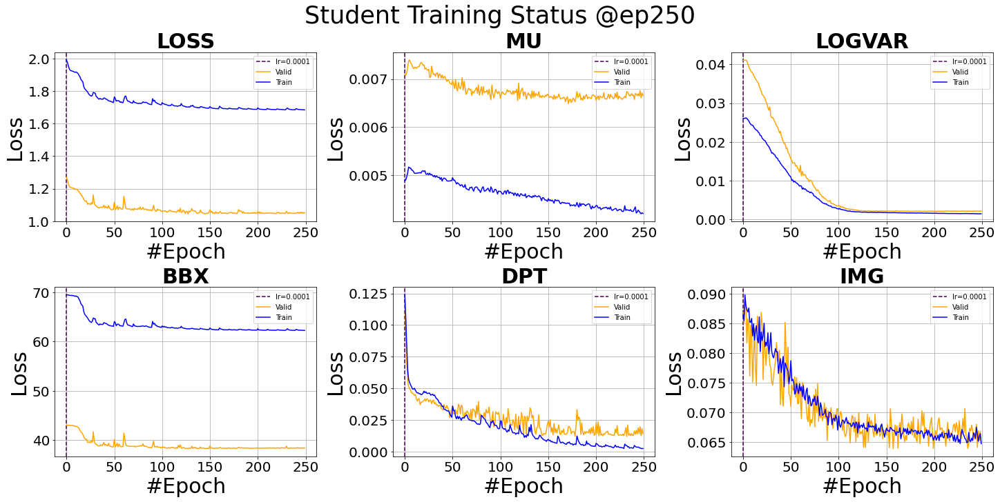

<Figure size 1440x720 with 0 Axes>

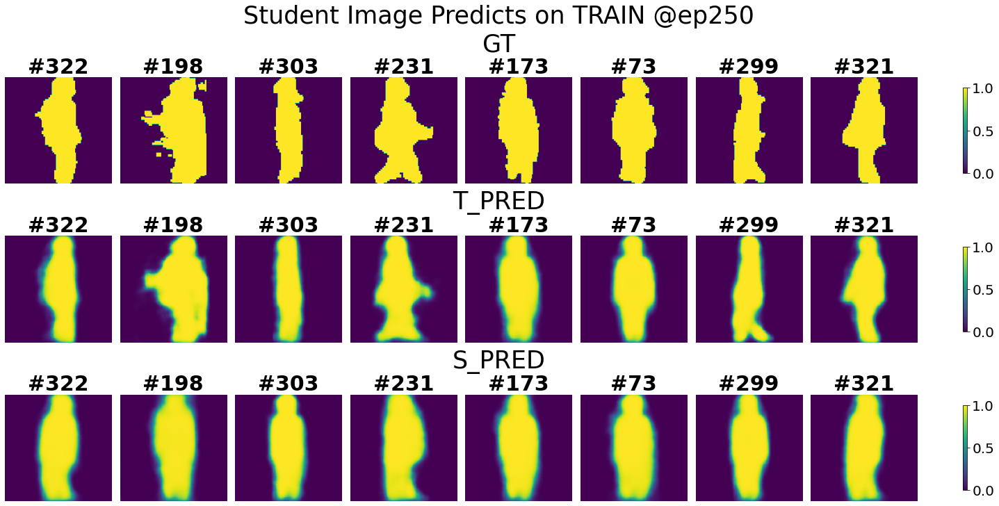

<Figure size 1440x720 with 0 Axes>

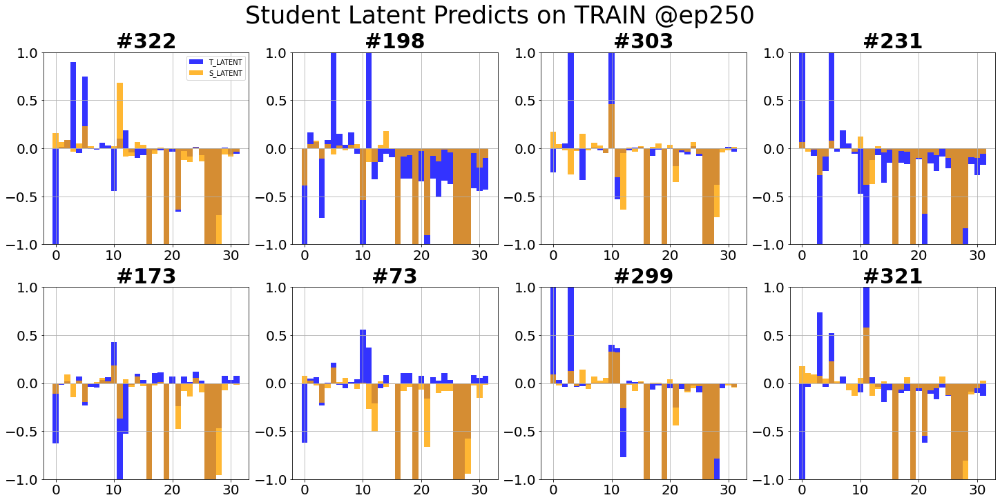

<Figure size 1440x720 with 0 Axes>

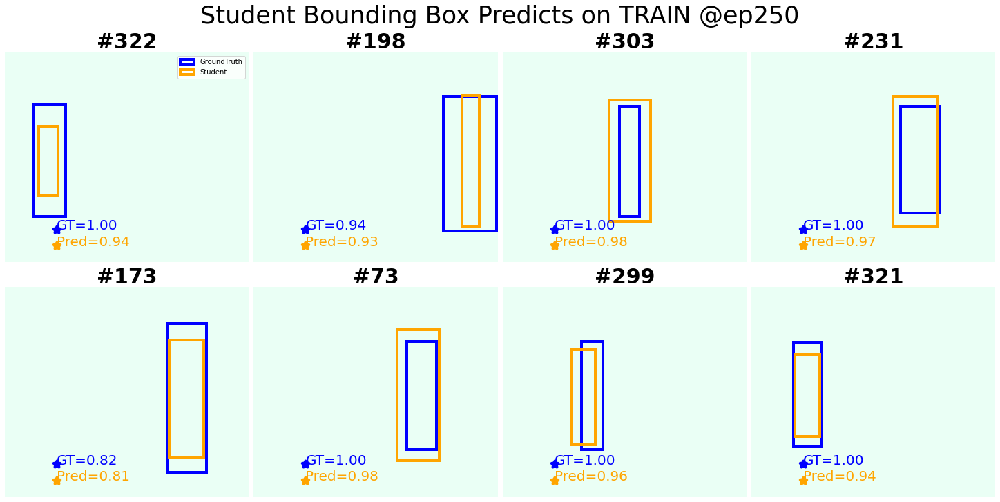

<Figure size 1440x720 with 0 Axes>

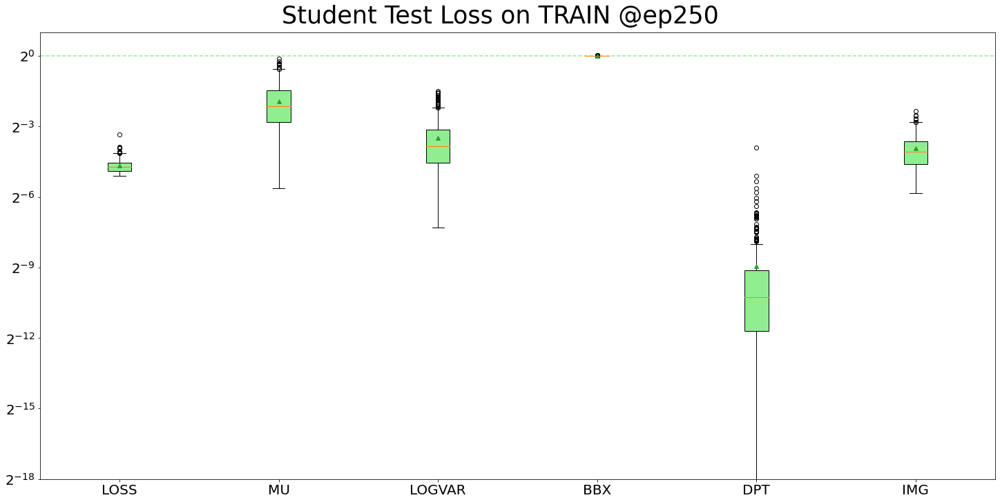

<Figure size 1440x720 with 0 Axes>

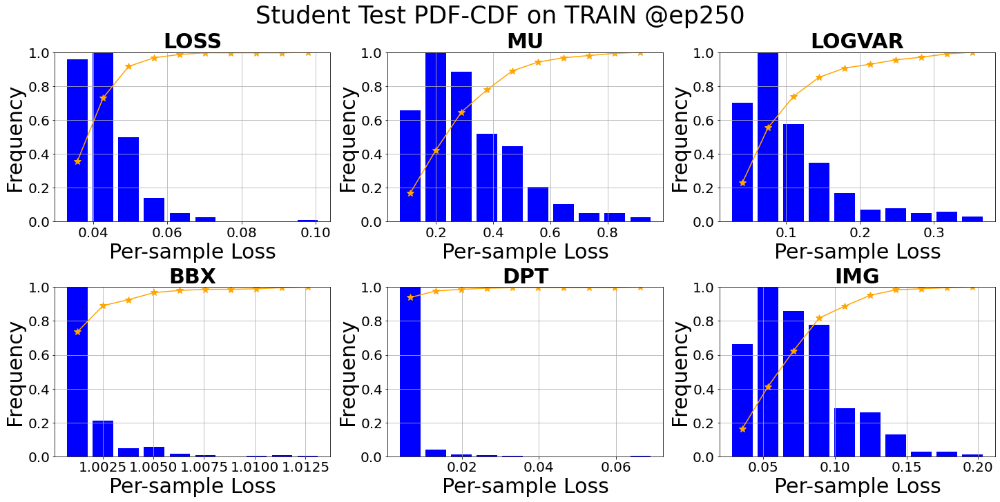

Student valid: epoch=9/10, batch=0/1, current best valid loss=1.0450        .0450    
Total training time: 41.998499155044556 sec


/home/bob/.local/lib/python3.7/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([])) that is different to the input size (torch.Size([1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Student test: sample=0/5, loss=0.0367    
Test finished. Average loss={'LOSS': 0.03898797654382094, 'MU': 0.2603595509310627, 'LOGVAR': 0.08783833849336653, 'BBX': 1.0010891884469526, 'DPT': 0.0016946255779589497, 'IMG': 0.06601893194498931}

Total training time: 5.070101261138916 sec


<Figure size 1440x720 with 0 Axes>

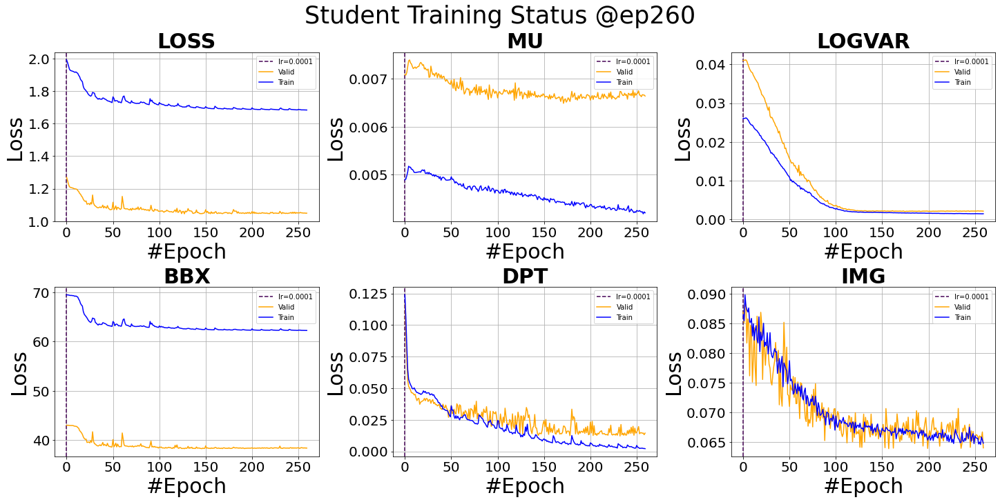

<Figure size 1440x720 with 0 Axes>

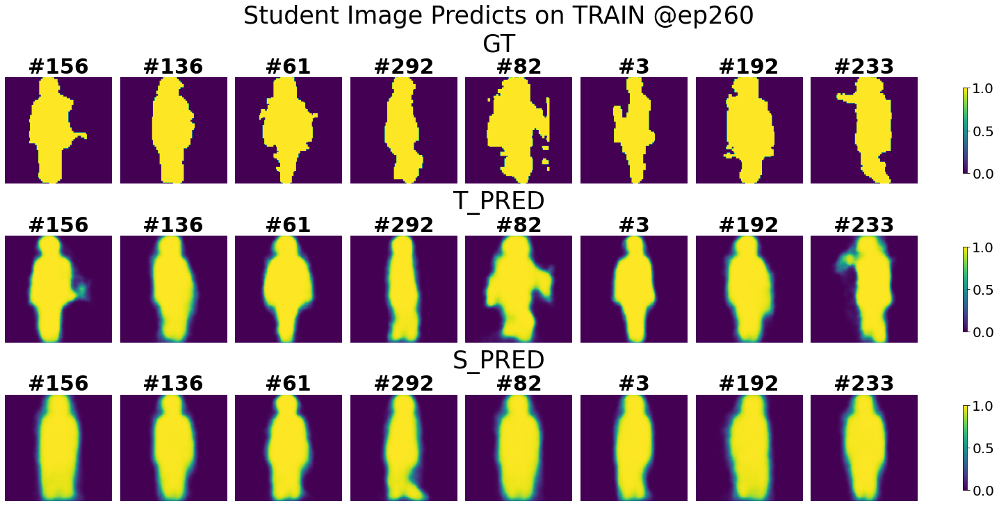

<Figure size 1440x720 with 0 Axes>

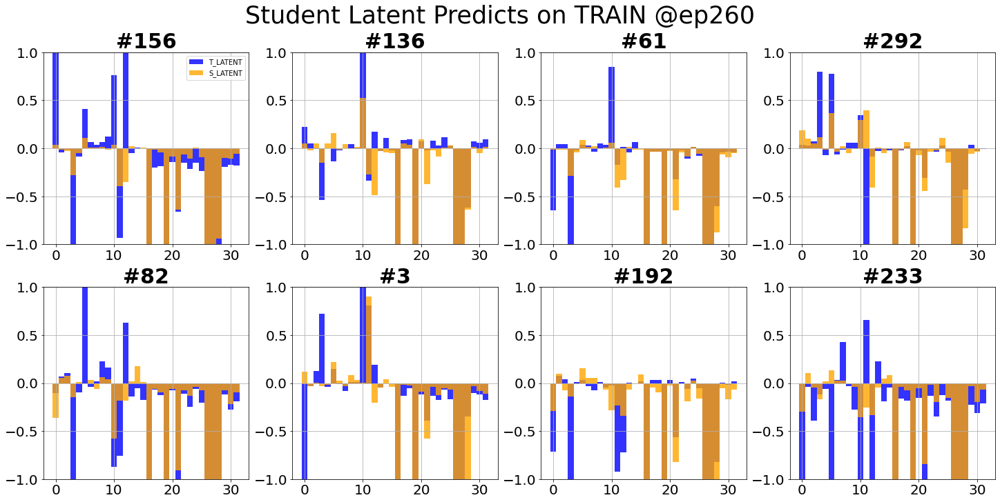

<Figure size 1440x720 with 0 Axes>

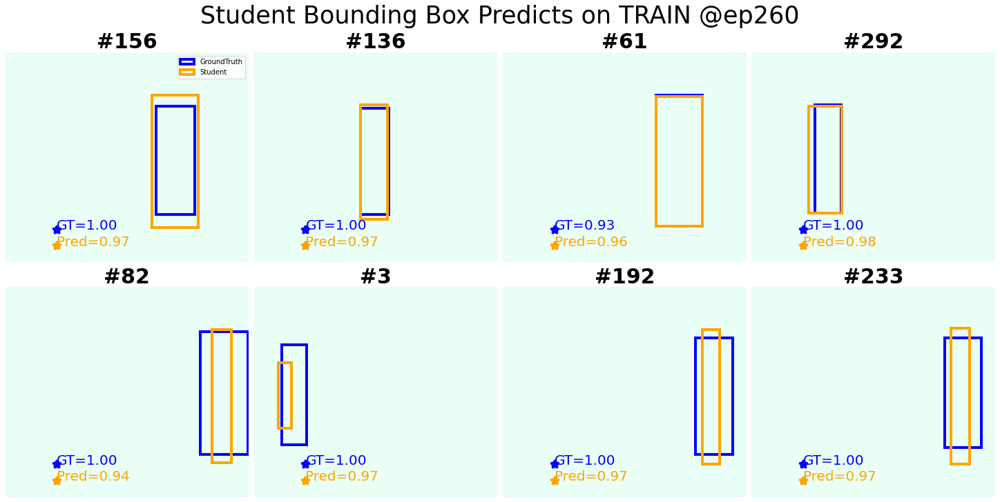

<Figure size 1440x720 with 0 Axes>

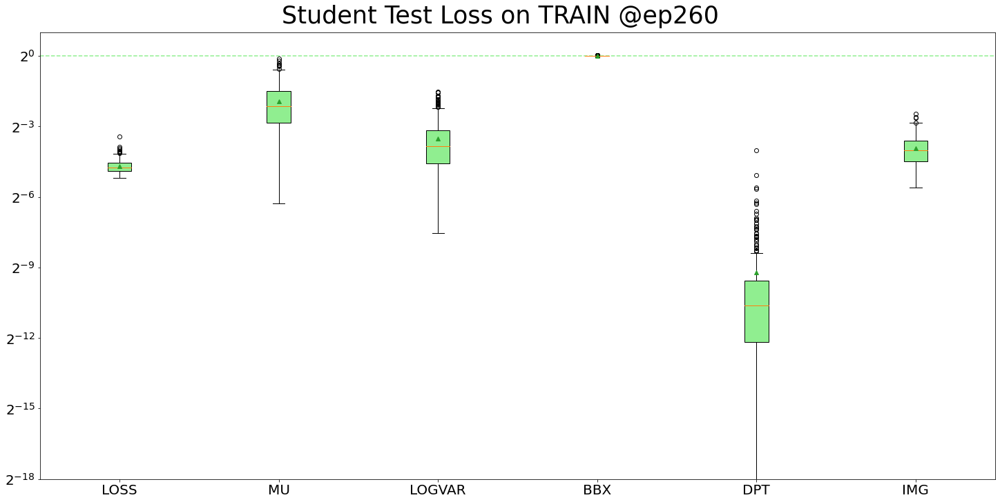

<Figure size 1440x720 with 0 Axes>

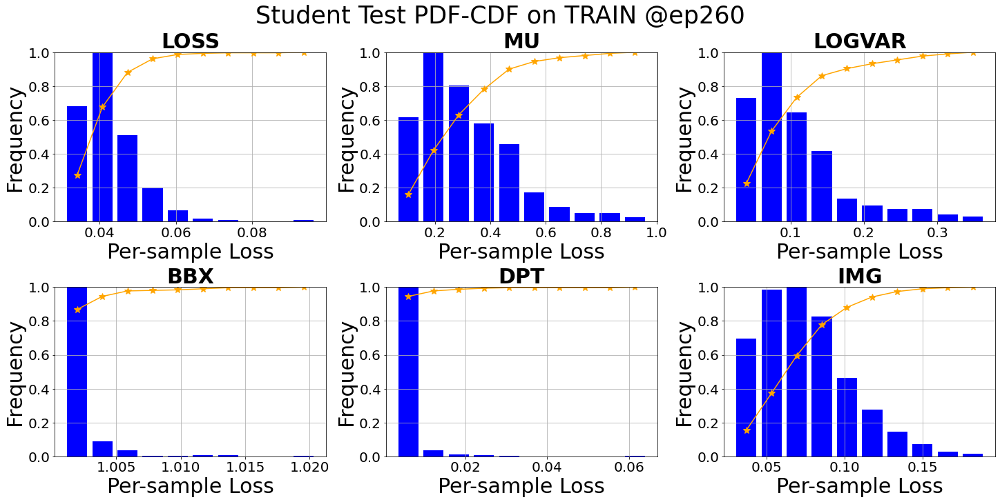

Student valid: epoch=9/10, batch=0/1, current best valid loss=1.0450        .0450    
Total training time: 42.30490159988403 sec


/home/bob/.local/lib/python3.7/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([])) that is different to the input size (torch.Size([1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Student test: sample=0/5, loss=0.0314    
Test finished. Average loss={'LOSS': 0.03876001906500369, 'MU': 0.25936555735455447, 'LOGVAR': 0.08666694525425649, 'BBX': 1.0008784287228845, 'DPT': 0.0015057368147475148, 'IMG': 0.06553211614753081}

Total training time: 5.0876734256744385 sec


<Figure size 1440x720 with 0 Axes>

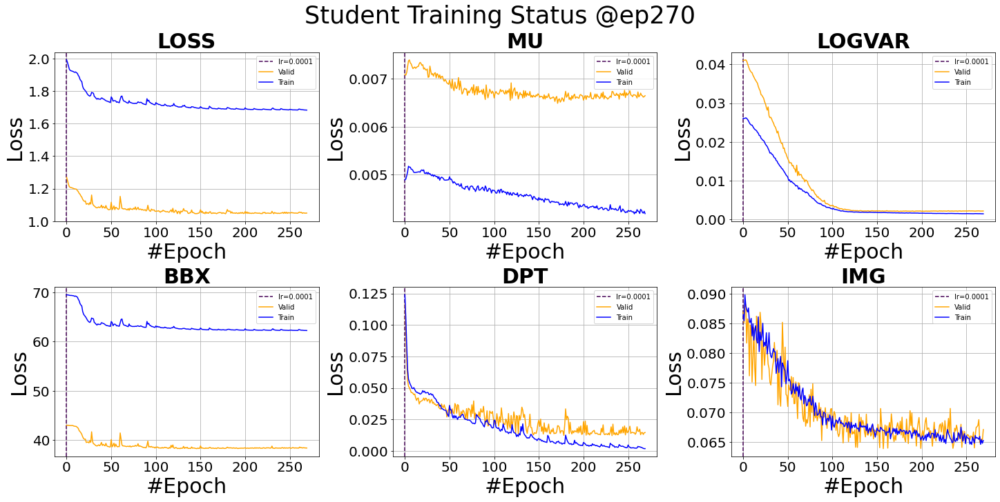

<Figure size 1440x720 with 0 Axes>

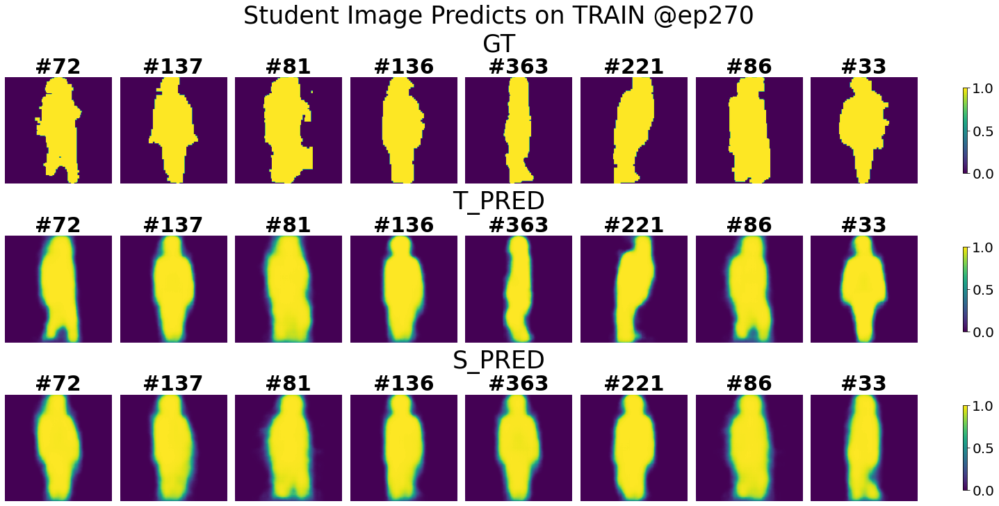

<Figure size 1440x720 with 0 Axes>

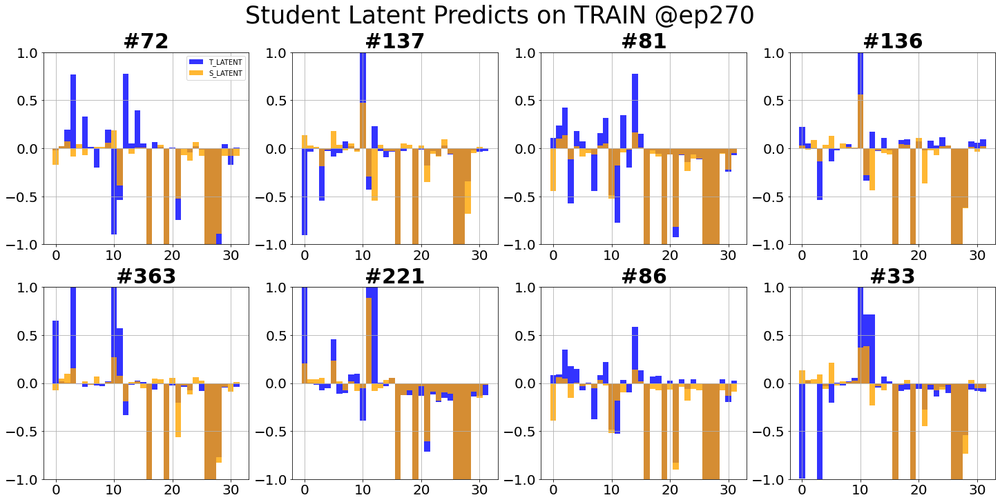

<Figure size 1440x720 with 0 Axes>

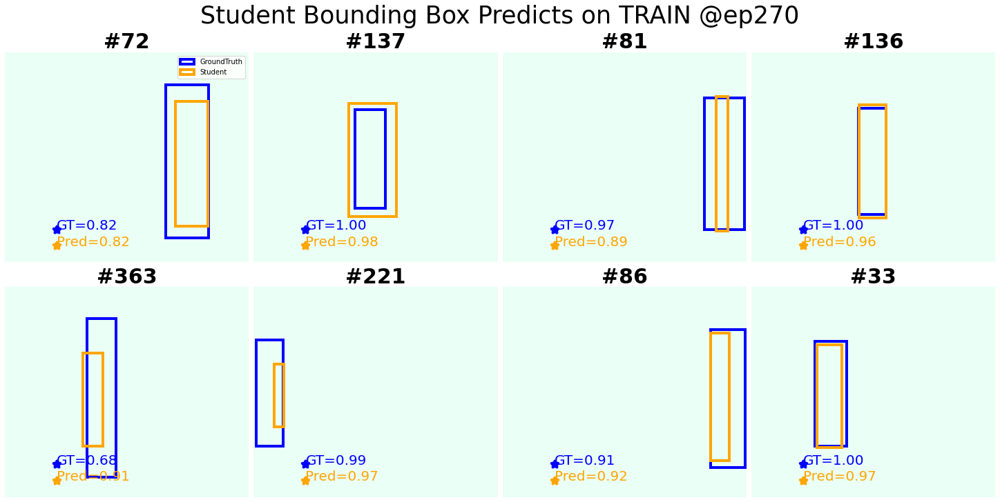

<Figure size 1440x720 with 0 Axes>

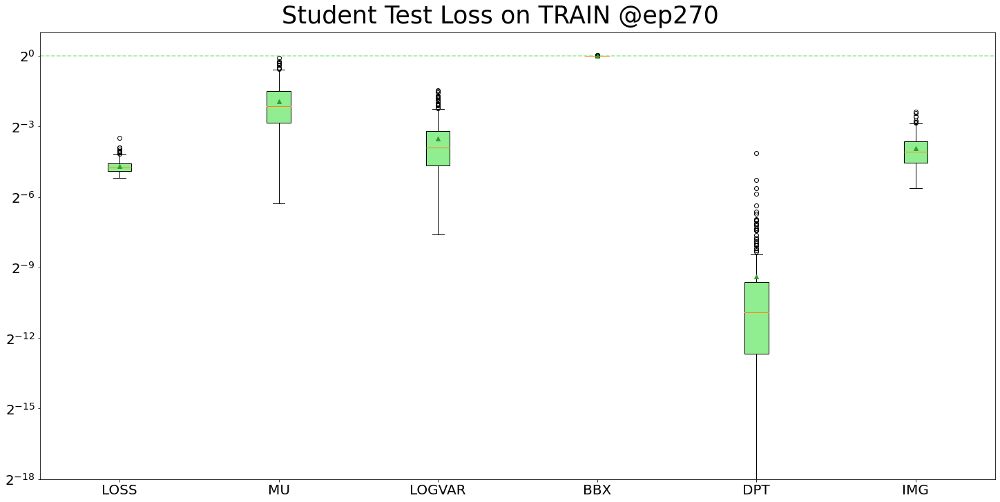

<Figure size 1440x720 with 0 Axes>

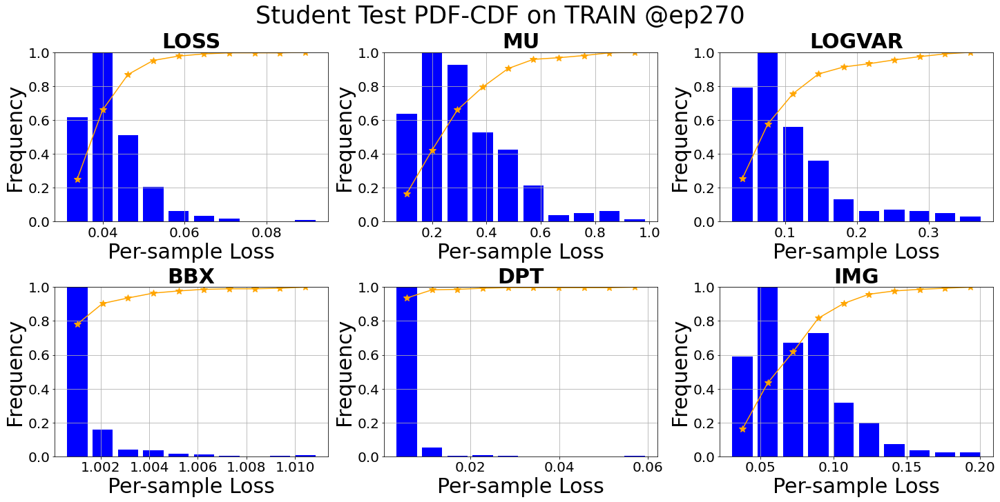

Student valid: epoch=9/10, batch=0/1, current best valid loss=1.0450        .0450    
Total training time: 41.8560004234314 sec


/home/bob/.local/lib/python3.7/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([])) that is different to the input size (torch.Size([1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Student test: sample=0/5, loss=0.0345    
Test finished. Average loss={'LOSS': 0.03881498826278368, 'MU': 0.2586663724836621, 'LOGVAR': 0.08607231364121296, 'BBX': 1.001205994001922, 'DPT': 0.0015892415297757891, 'IMG': 0.06475331775029564}

Total training time: 5.054125547409058 sec


<Figure size 1440x720 with 0 Axes>

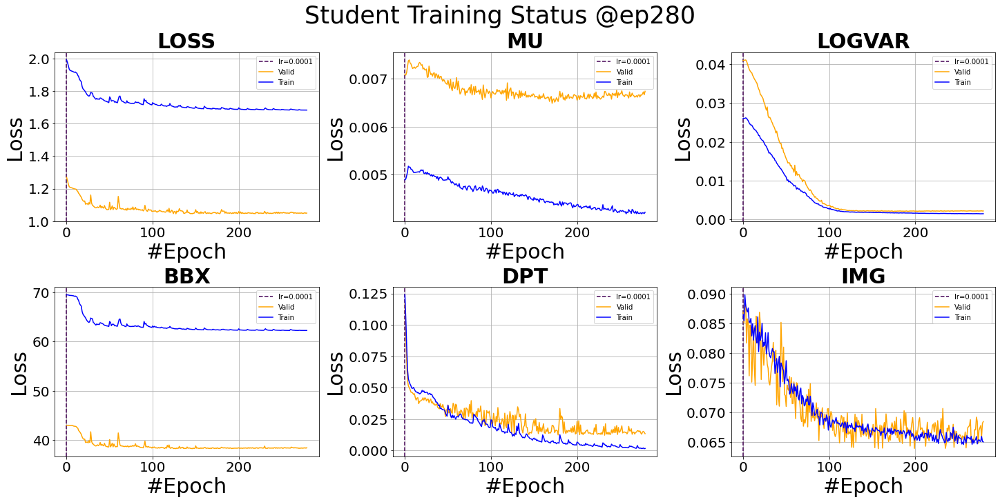

<Figure size 1440x720 with 0 Axes>

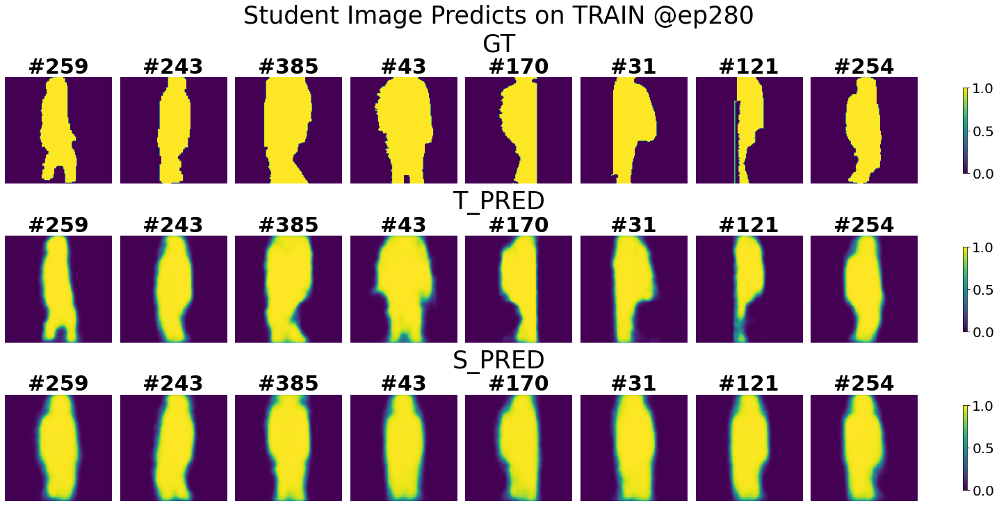

<Figure size 1440x720 with 0 Axes>

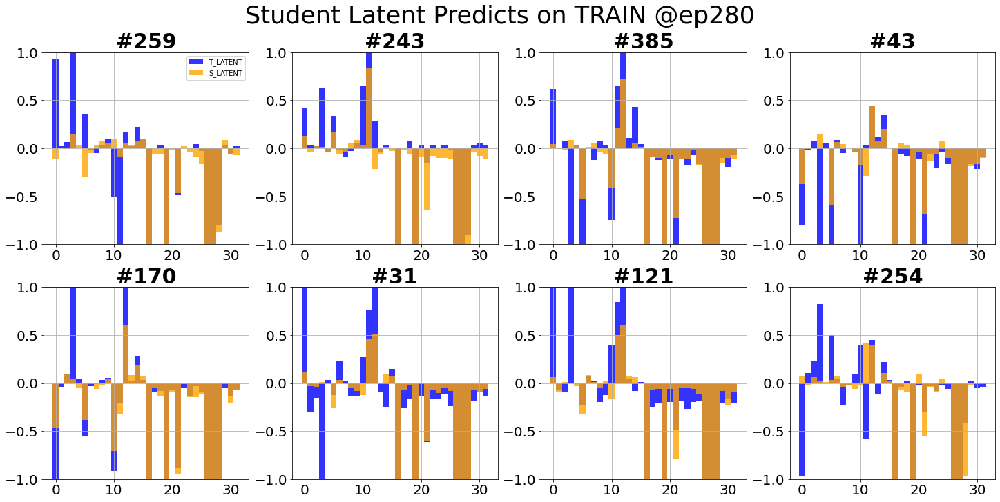

<Figure size 1440x720 with 0 Axes>

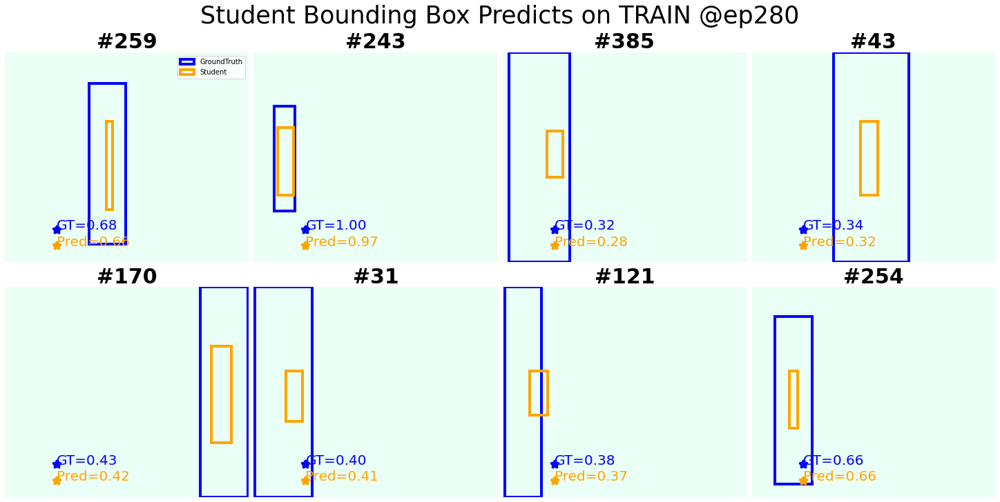

<Figure size 1440x720 with 0 Axes>

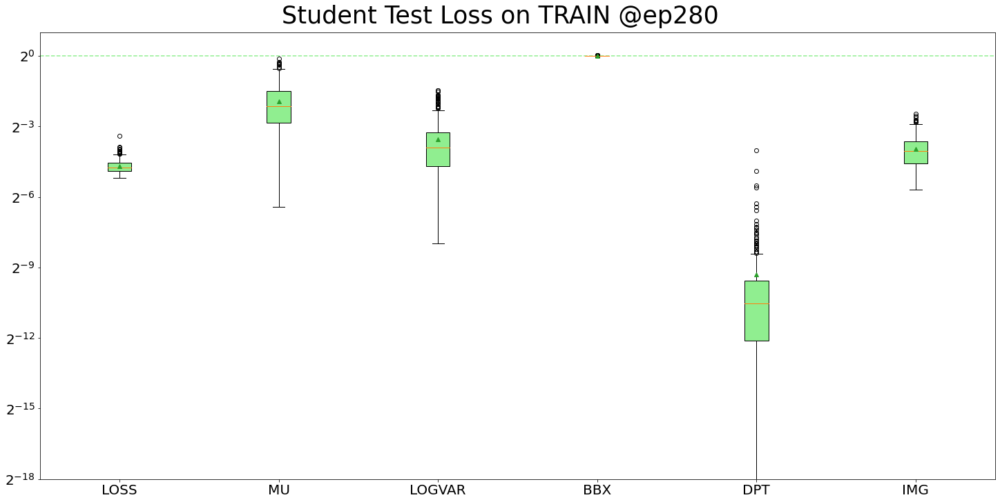

<Figure size 1440x720 with 0 Axes>

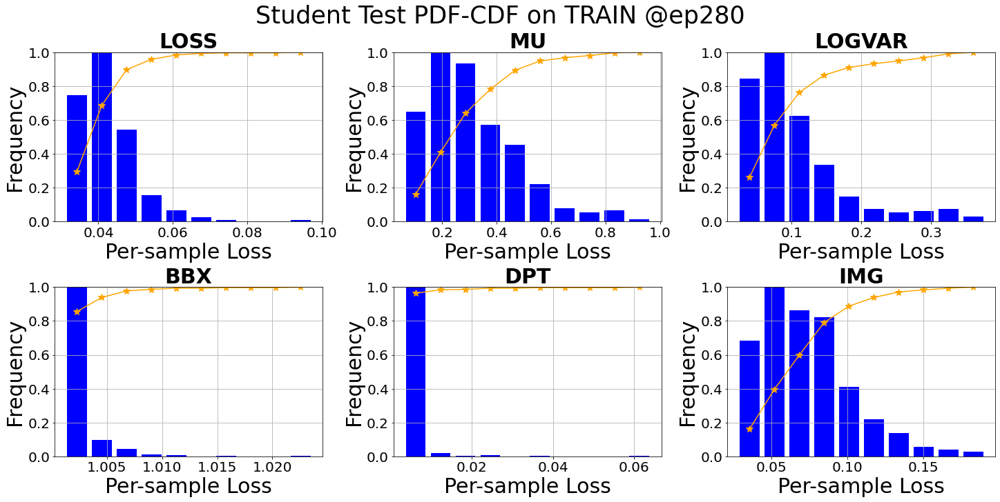

Student valid: epoch=9/10, batch=0/1, current best valid loss=1.0450        .0450    
Total training time: 41.888203382492065 sec


/home/bob/.local/lib/python3.7/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([])) that is different to the input size (torch.Size([1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Student test: sample=0/5, loss=0.0329    
Test finished. Average loss={'LOSS': 0.03837567531890041, 'MU': 0.2576260052747138, 'LOGVAR': 0.08554325863820803, 'BBX': 1.0007675656168407, 'DPT': 0.0011742063115533824, 'IMG': 0.0658072874524969}

Total training time: 5.078235864639282 sec


<Figure size 1440x720 with 0 Axes>

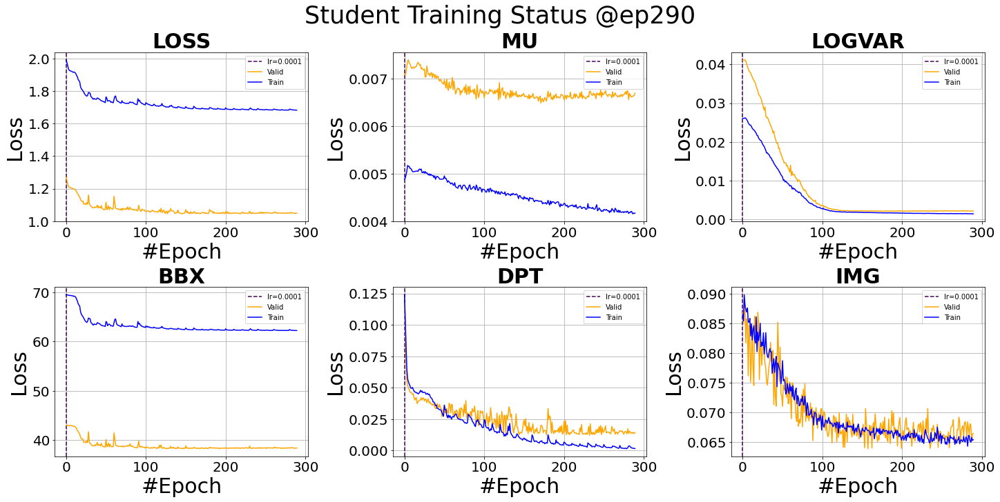

<Figure size 1440x720 with 0 Axes>

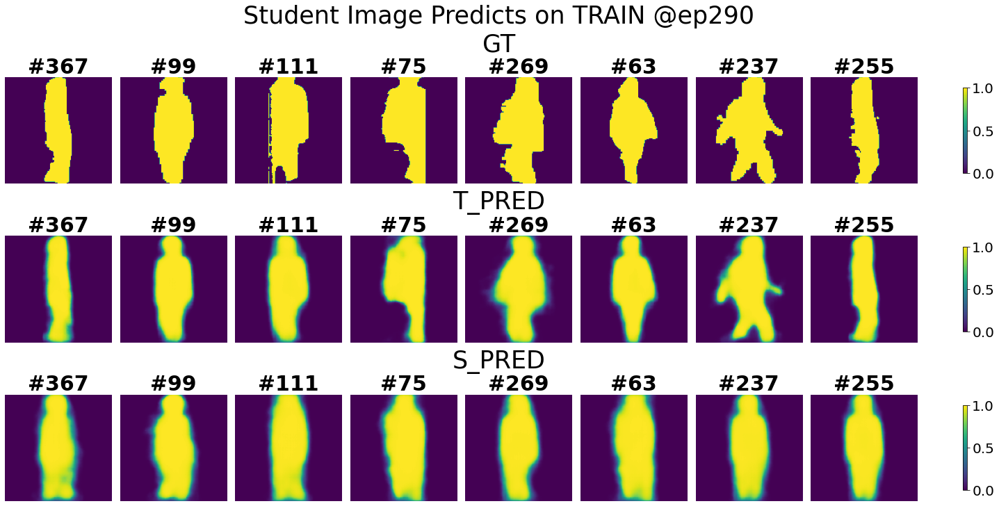

<Figure size 1440x720 with 0 Axes>

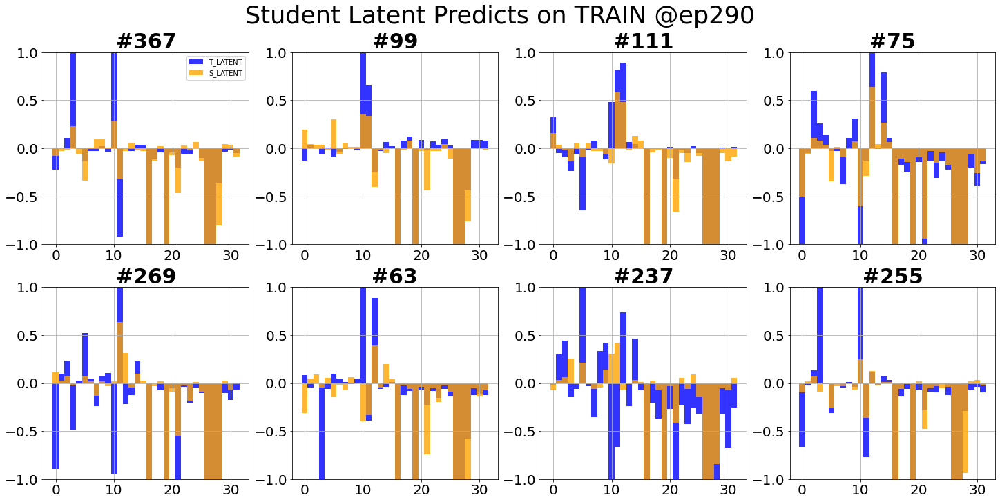

<Figure size 1440x720 with 0 Axes>

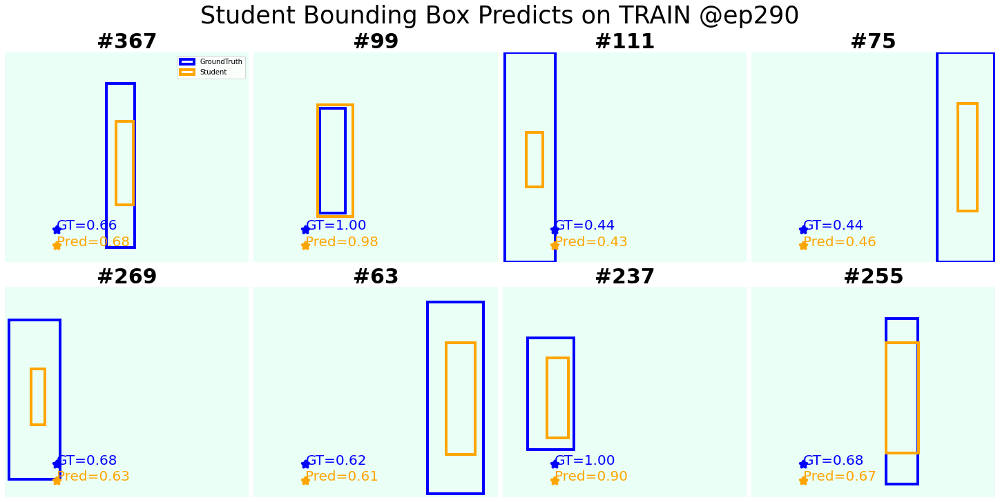

<Figure size 1440x720 with 0 Axes>

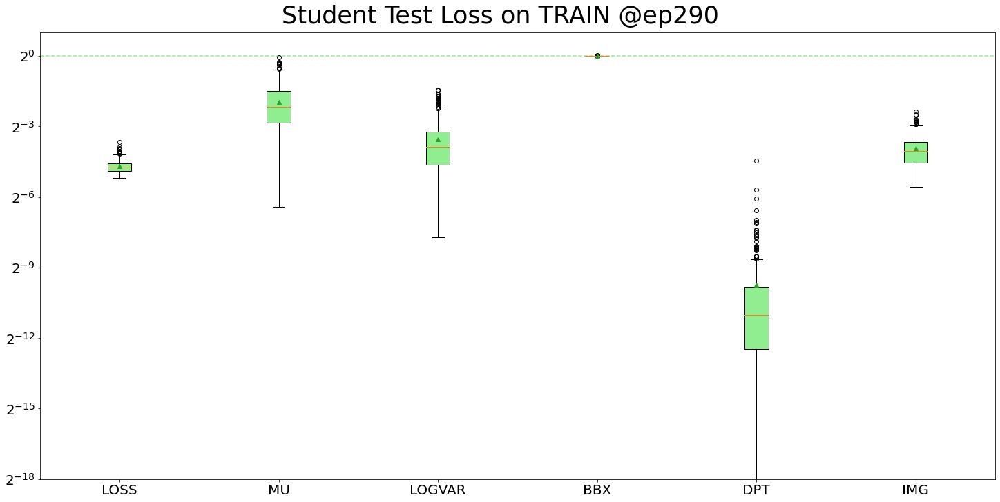

<Figure size 1440x720 with 0 Axes>

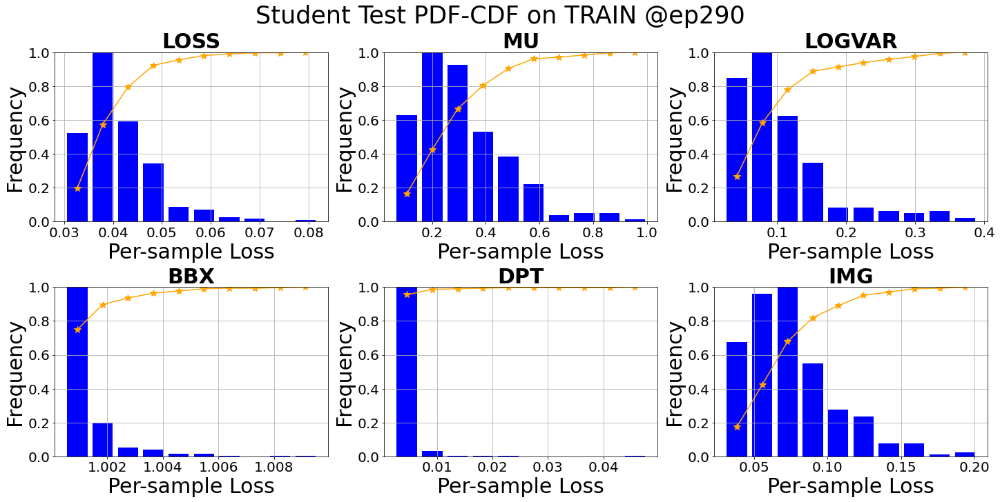

Student valid: epoch=9/10, batch=0/1, current best valid loss=1.0450        .0450    
Total training time: 42.090253829956055 sec


/home/bob/.local/lib/python3.7/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([])) that is different to the input size (torch.Size([1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Student test: sample=0/5, loss=0.0333    
Test finished. Average loss={'LOSS': 0.03813527614908395, 'MU': 0.25651969560616655, 'LOGVAR': 0.08508413673716918, 'BBX': 1.000643814491689, 'DPT': 0.0009667316308810375, 'IMG': 0.06577862515278951}

Total training time: 5.085809230804443 sec


<Figure size 1440x720 with 0 Axes>

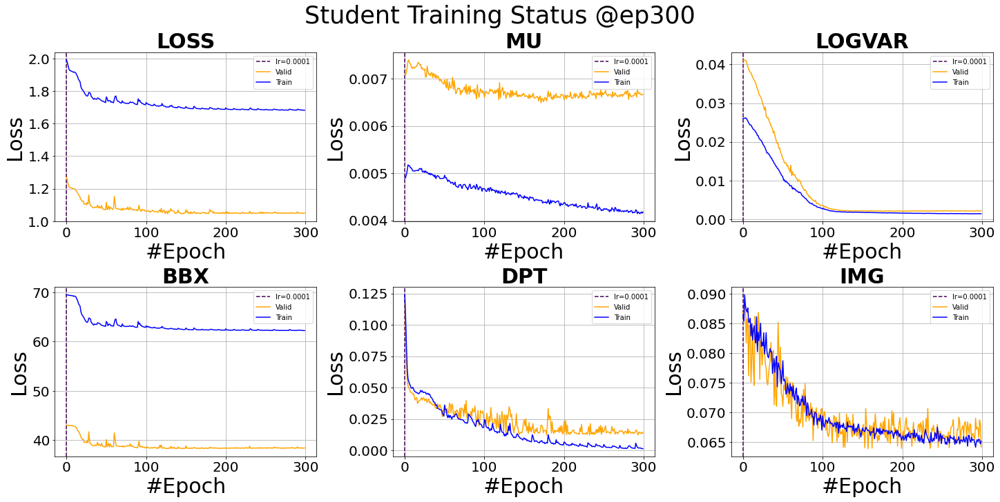

<Figure size 1440x720 with 0 Axes>

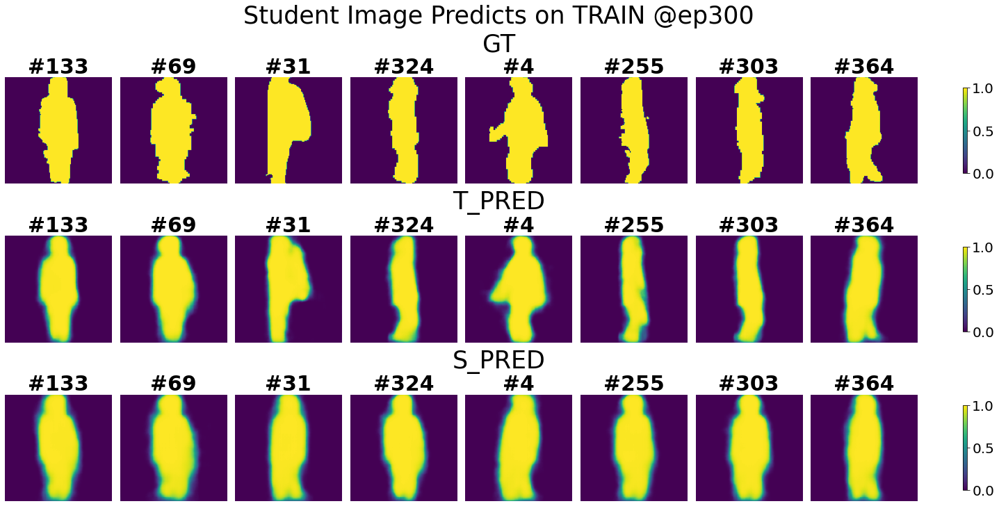

<Figure size 1440x720 with 0 Axes>

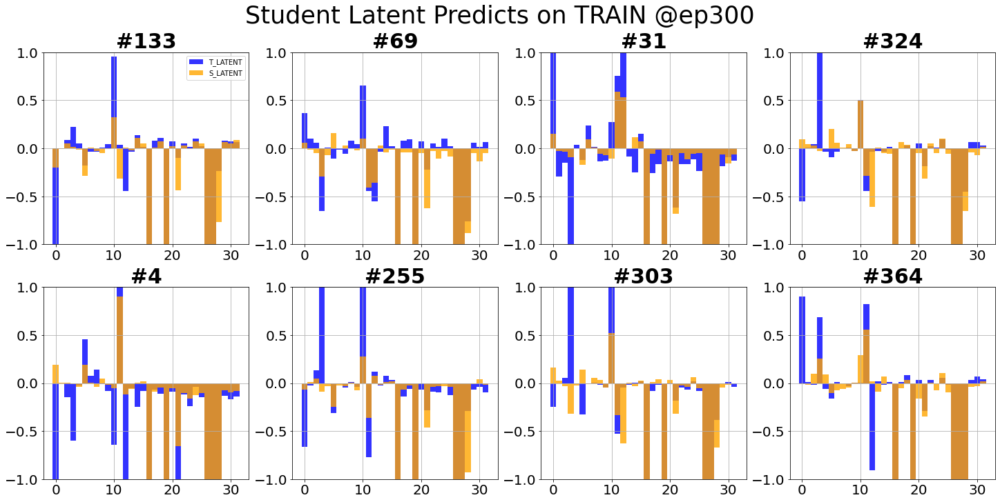

<Figure size 1440x720 with 0 Axes>

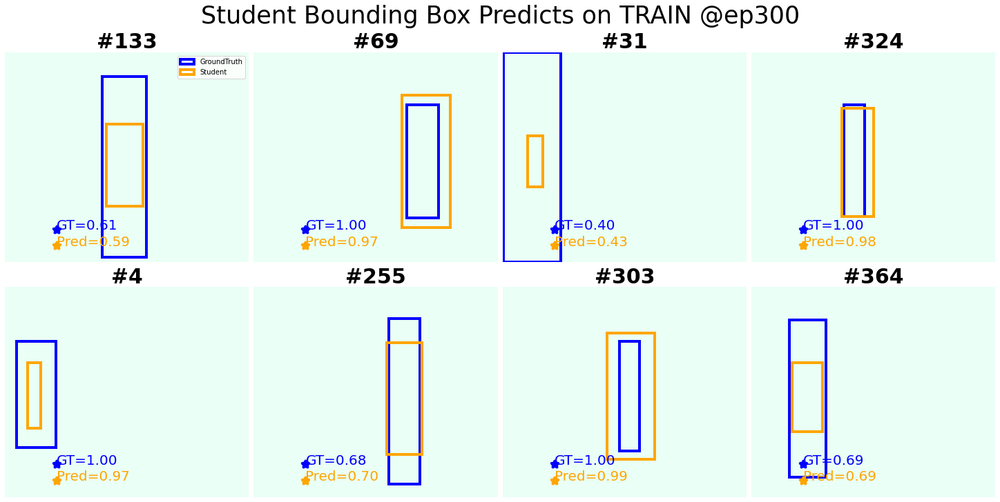

<Figure size 1440x720 with 0 Axes>

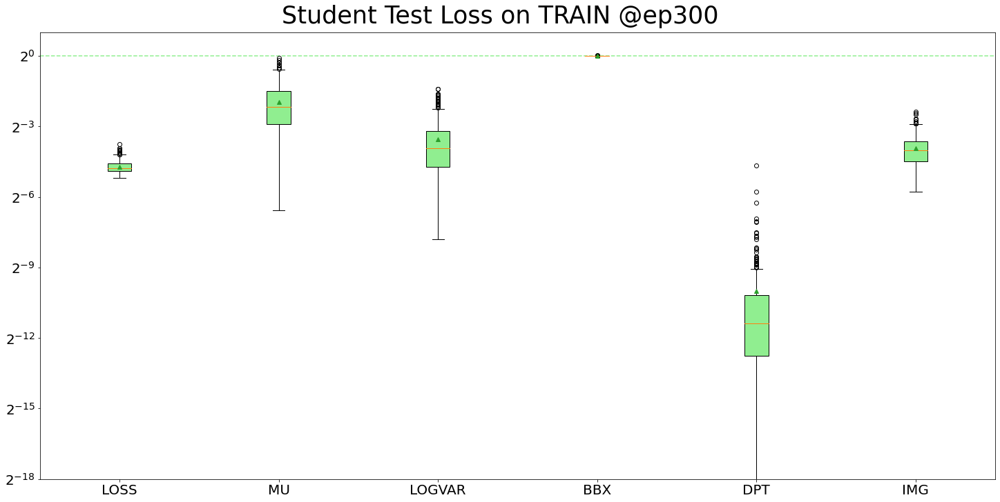

<Figure size 1440x720 with 0 Axes>

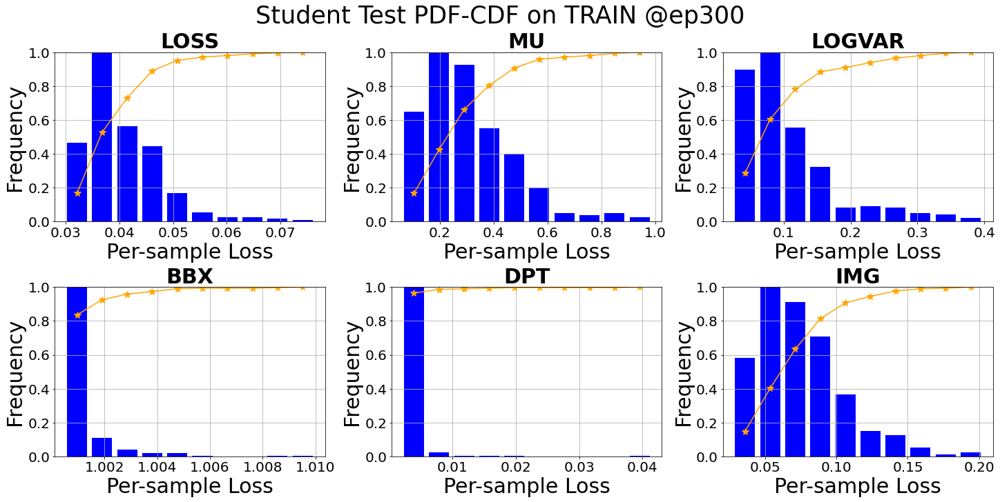


Schedule Completed!


In [10]:
### Scheduler
%matplotlib inline
#trainer1.lr=1e-5
S_trainer.scheduler(turns=10,
                  test_loader='train', select_num=8,
                  autosave=True, notion=f"{date_run}", train_module={'csien', 'bbxde'}, eval_module={'imgen', 'imgde'}, save_model=False)

Student test: sample=10/40, loss=0.0347    

/home/bob/.local/lib/python3.7/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([])) that is different to the input size (torch.Size([1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Student test: sample=35/40, loss=0.0377    
Test finished. Average loss={'LOSS': 0.05101666450500488, 'MU': 0.24823039141483605, 'LOGVAR': 0.10584099648986012, 'BBX': 1.0106687158346177, 'DPT': 0.014708415599761793, 'IMG': 0.0737120445817709}

Total training time: 0.7061223983764648 sec


<Figure size 1440x720 with 0 Axes>

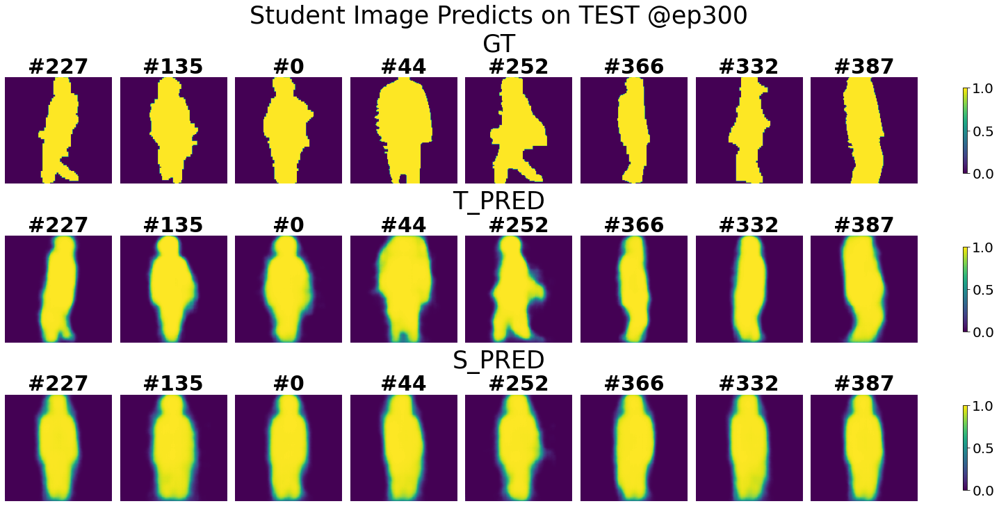

<Figure size 1440x720 with 0 Axes>

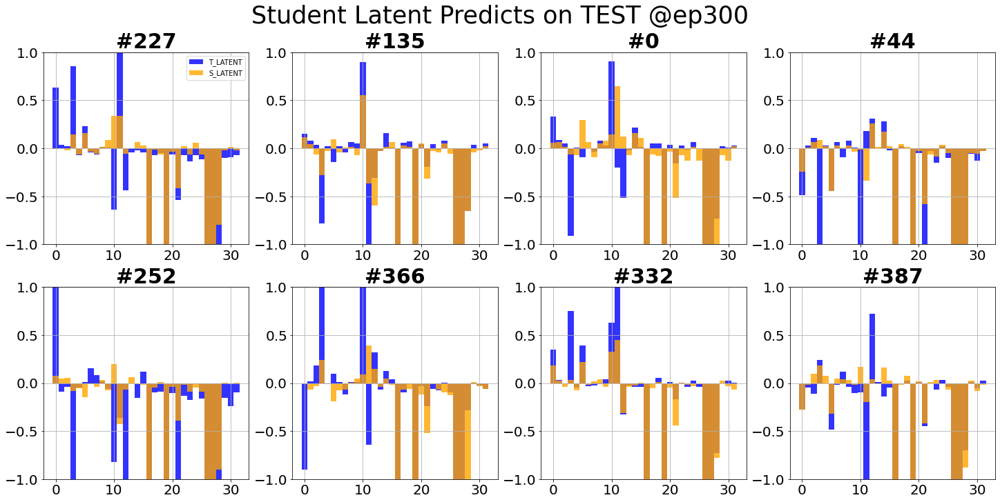

<Figure size 1440x720 with 0 Axes>

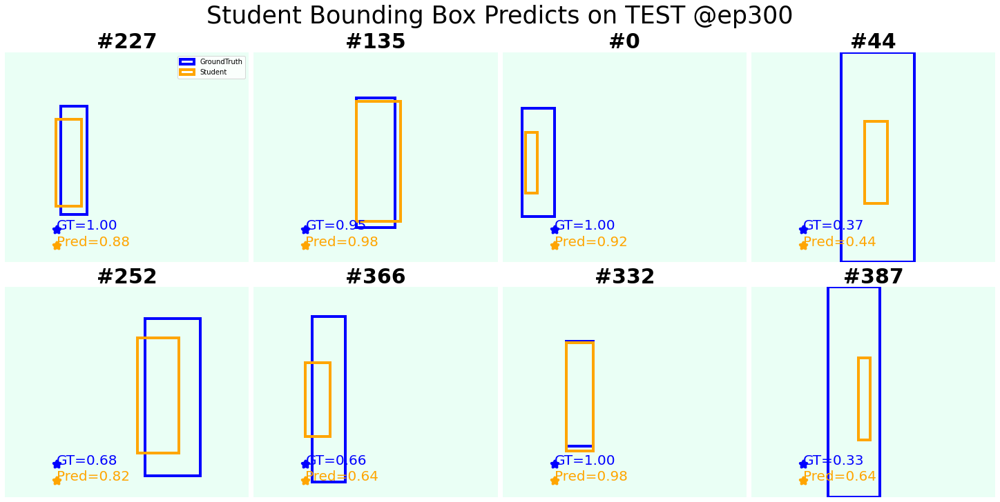

<Figure size 1440x720 with 0 Axes>

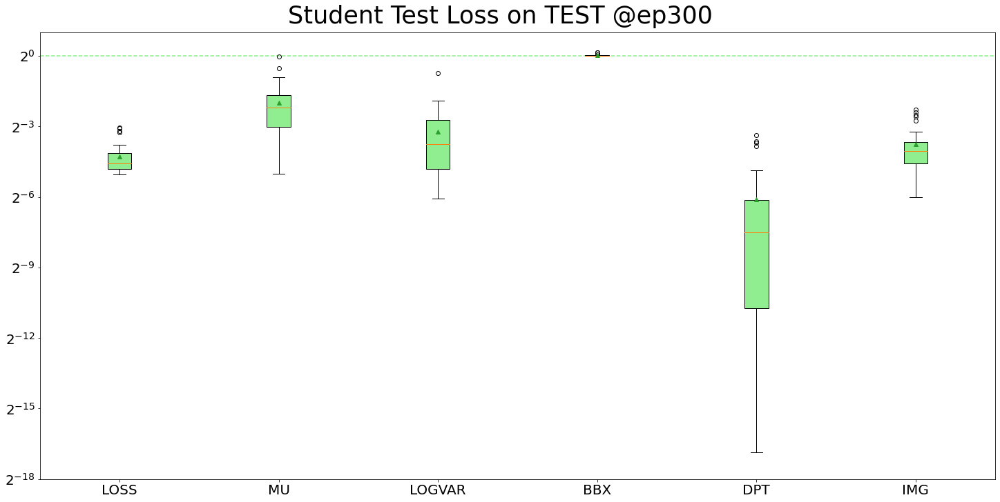

<Figure size 1440x720 with 0 Axes>

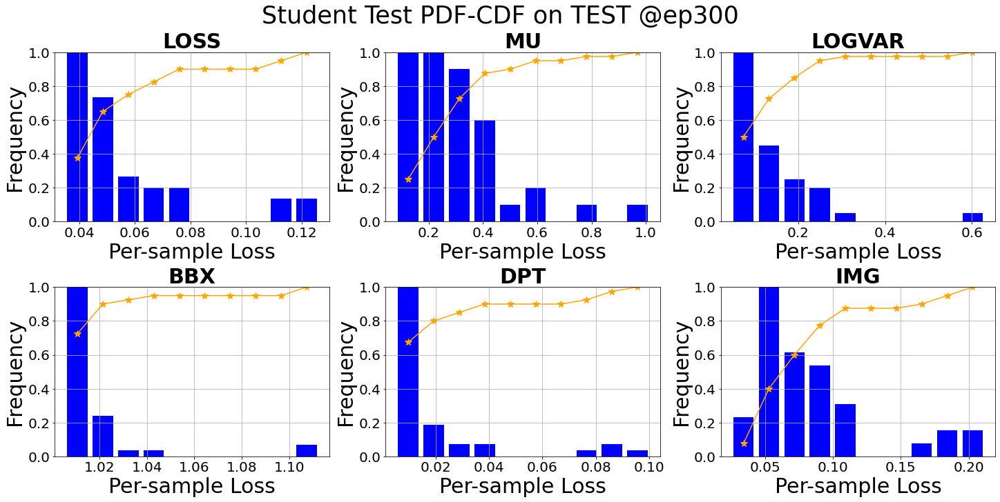

In [11]:
S_trainer.test(loader='test')
S_trainer.plot_test(select_num=8, autosave=True, notion=f"{date_run}")

In [12]:
S_trainer.save(date_run)

Saving models...
Saving csien...
Saving bbxde...
Saving imgen...
Saving imgde...
All saved!


In [13]:
S_trainer.loss.save('pred', date_run)

Saving pred including GT, T_PRED, S_PRED, T_LATENT, S_LATENT, GT_BBX, S_BBX, GT_DPT, S_DPT, IND...Done


#### Test

/home/bob/datastore/Models/Trainer.py:191: UserWarning: Casting complex values to real discards the imaginary part (Triggered internally at ../aten/src/ATen/native/Copy.cpp:250.)
  data_[key] = value.to(torch.float32).to(self.device)
/home/bob/.local/lib/python3.7/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([])) that is different to the input size (torch.Size([1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Student test: sample=15/17, loss=0.1052    
Test finished. Average loss={'LOSS': 0.0577851046802928, 'MU': 0.35868602988407744, 'LOGVAR': 0.17540513204082397, 'BBX': 0.5955600273343461, 'DPT': 0.029040615619575945, 'IMG': 0.07803787530129365}

Total training time: 9.84715747833252 sec


<Figure size 432x288 with 0 Axes>

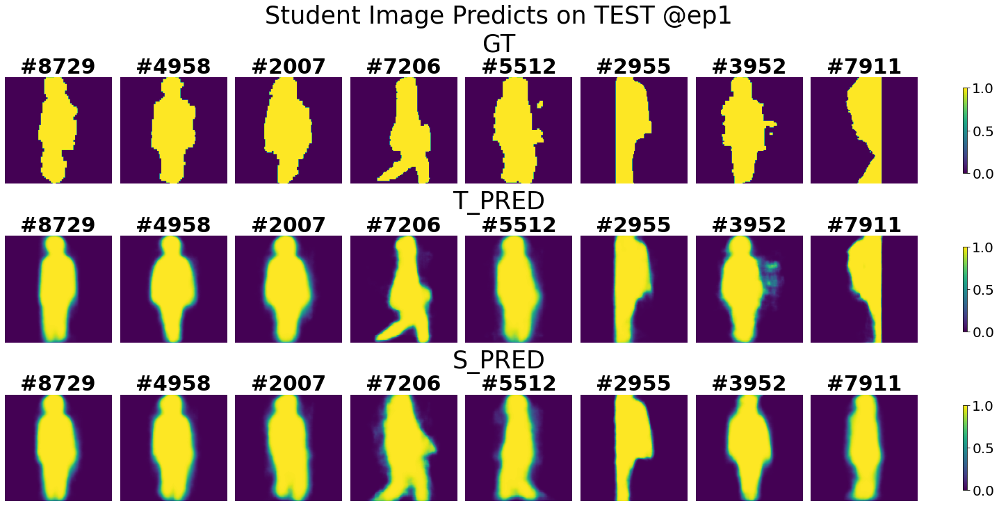

<Figure size 1440x720 with 0 Axes>

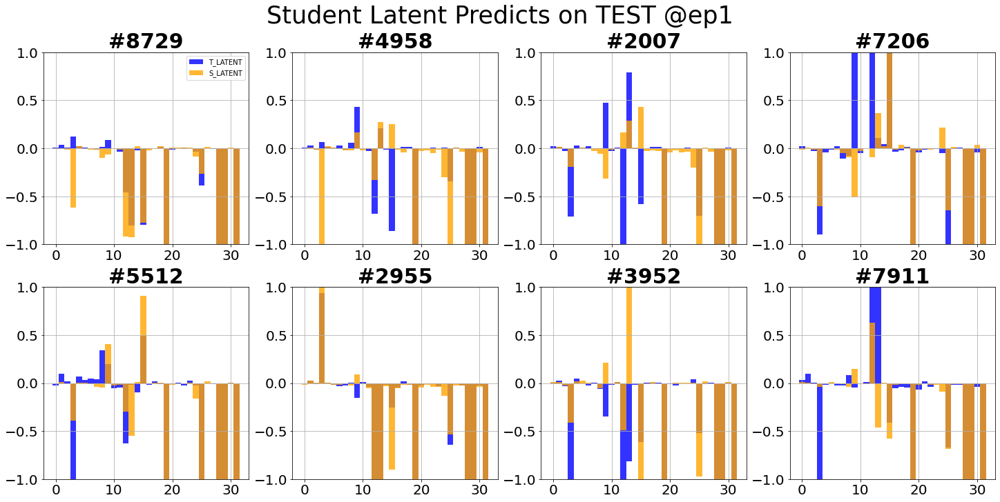

<Figure size 1440x720 with 0 Axes>

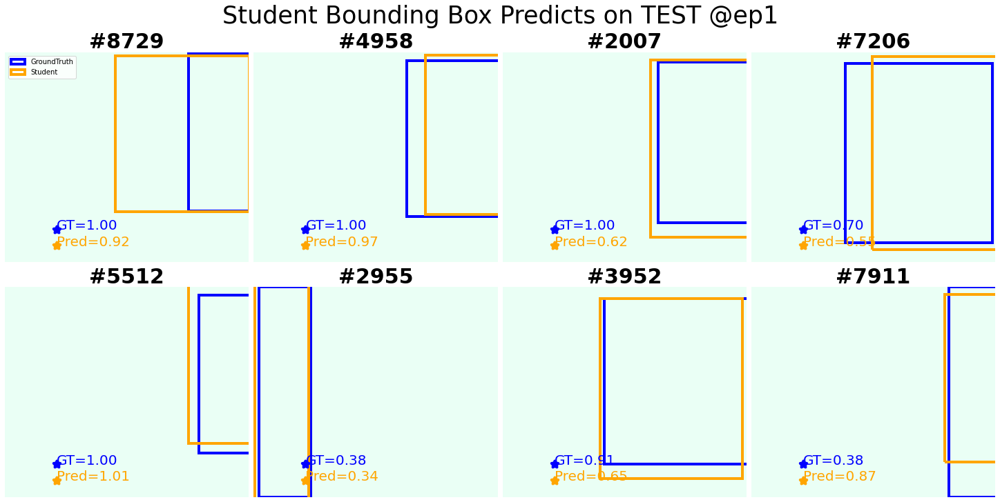

<Figure size 1440x720 with 0 Axes>

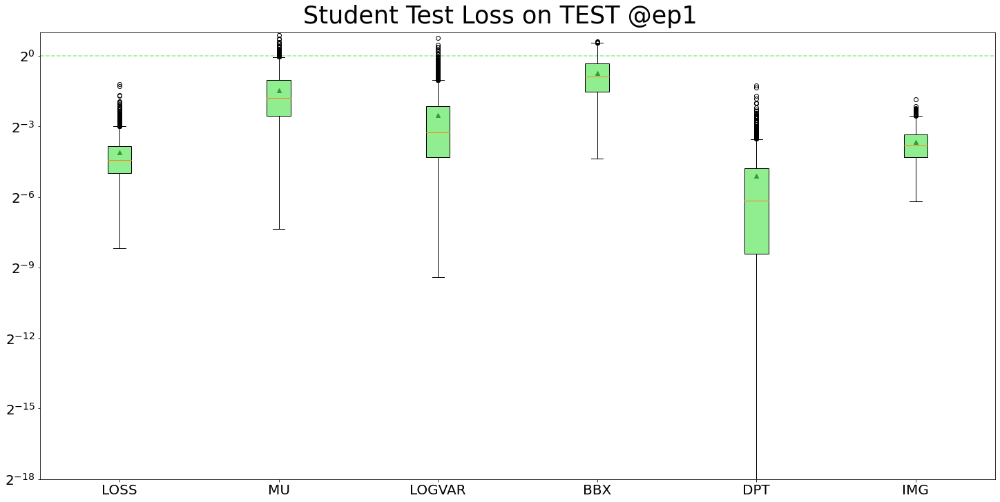

<Figure size 1440x720 with 0 Axes>

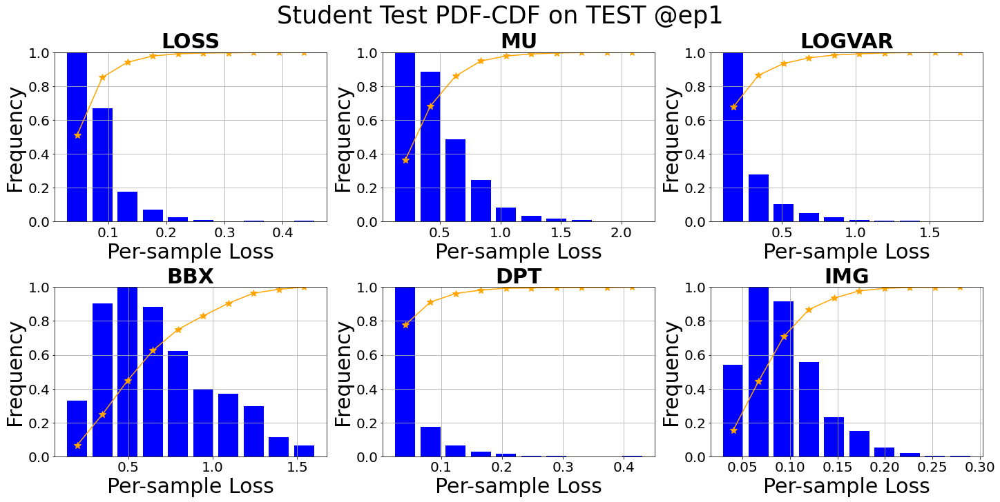

In [5]:
torch.cuda.set_device(gpu)
csiencoder = TP.CSIEncoder()
bbxdecoder = TP.BBXDecoder()
imgencoder = TP.ImageEncoder(latent_dim=16)
imgdecoder = TP.ImageDecoder(latent_dim=16)

imgencoder.load_state_dict(torch.load(f"../saved/240320R2/240320R2_Student_IMGENV06C2@ep200.pth"))
imgdecoder.load_state_dict(torch.load(f"../saved/240320R2/240320R2_Student_IMGDEV06C2@ep200.pth"))
csiencoder.load_state_dict(torch.load(f"../saved/240320R2/240320R2_Student_CSIENV06C2@ep200.pth"))
bbxdecoder.load_state_dict(torch.load(f"../saved/240320R2/240320R2_Student_BBXDEV06C2@ep200.pth"))

S_trainer = TP.StudentTrainer(
                              name='Student', mask=True,
    networks=[csiencoder, bbxdecoder, imgencoder, imgdecoder],
                 lr=1e-4, epochs=10, cuda=gpu,
                 train_loader=train_loader, valid_loader=valid_loader, test_loader=test_loader)

S_trainer.test(loader='test')
S_trainer.plot_test(select_num=8, autosave=True, notion=f"{date_run}_Comp")

In [7]:
S_trainer.loss.save('pred', f"{date_run}_Comp")

Saving pred including GT T_PRED S_PRED T_LATENT S_LATENT GT_BBX S_BBX GT_DPT S_DPT IND...Done
